In [1]:
import pandas as pd
file = pd.read_csv("wdbc.csv") 
print("\nOriginal file:") 
# print(file) 
  
# adding header 
headerList = ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']

# converting data frame to csv 
file.to_csv("wbdc2.csv", header=headerList, index=False) 
  
# # display modified csv file 
# file2 = pd.read_csv("gfg2.csv") 
# print('\nModified file:') 
# print(file2) 


Original file:


         id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0    842517         M        20.57         17.77          132.90     1326.0   
1  84300903         M        19.69         21.25          130.00     1203.0   
2  84348301         M        11.42         20.38           77.58      386.1   
3  84358402         M        20.29         14.34          135.10     1297.0   
4    843786         M        12.45         15.70           82.57      477.1   

   smoothness_mean  compactness_mean  concavity_mean  concave_points_mean  \
0          0.08474           0.07864          0.0869              0.07017   
1          0.10960           0.15990          0.1974              0.12790   
2          0.14250           0.28390          0.2414              0.10520   
3          0.10030           0.13280          0.1980              0.10430   
4          0.12780           0.17000          0.1578              0.08089   

   ...  radius_worst  texture_worst  perimeter_worst  area_wor

<Figure size 2000x2000 with 0 Axes>

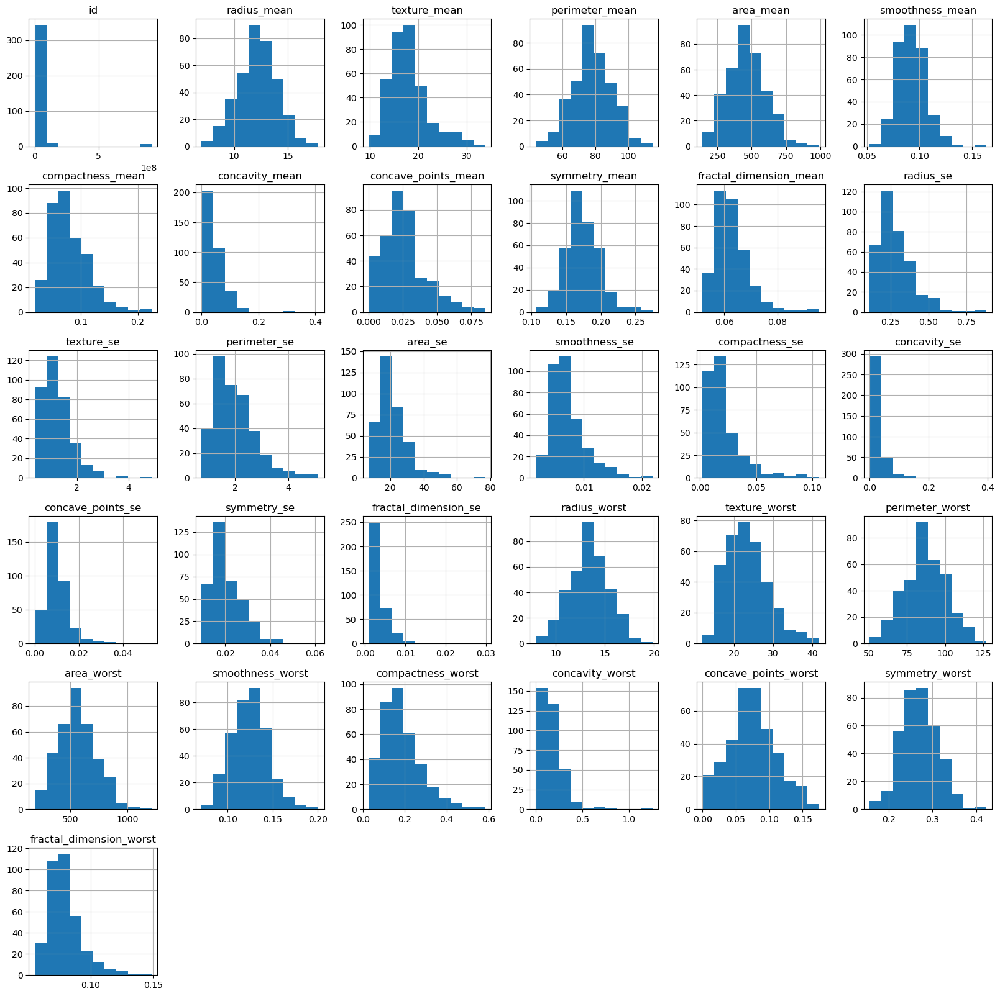

<Figure size 2000x2000 with 0 Axes>

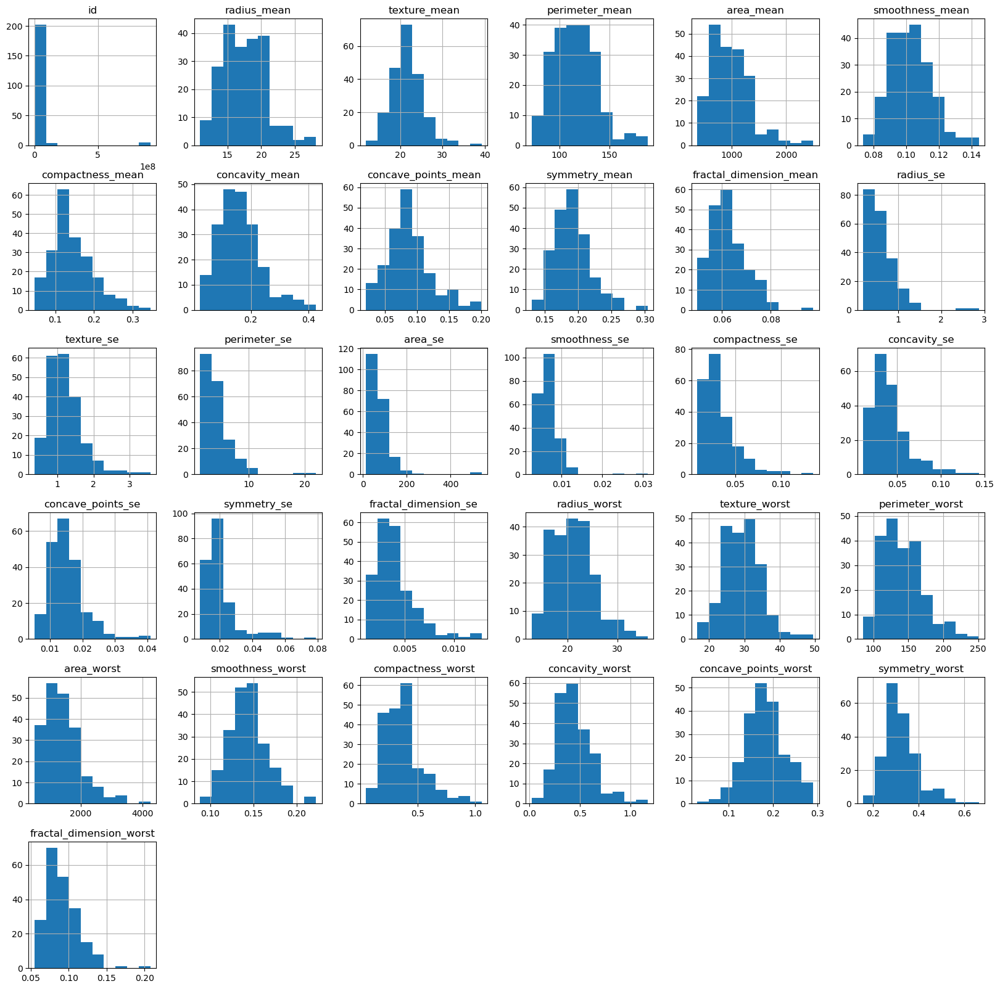

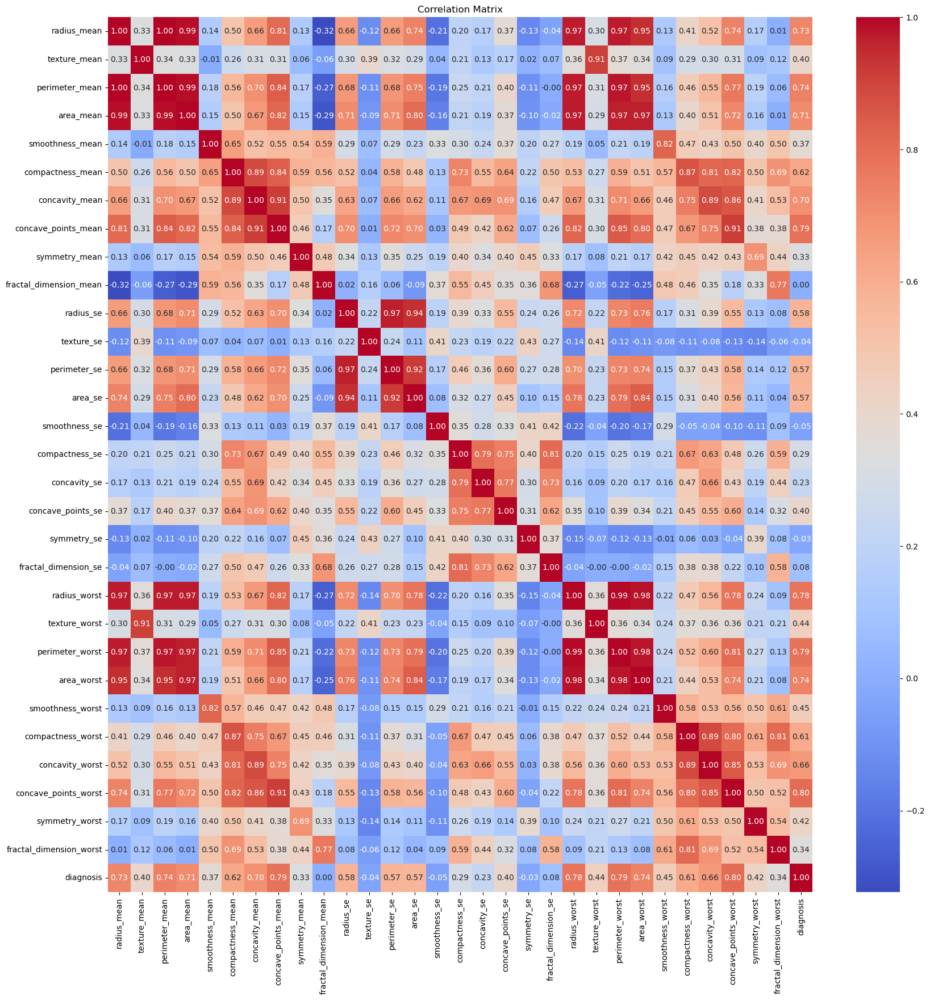

In [2]:
#Classification of cancer dignosis
#importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve, average_precision_score


#importing the dataset 
dataset = pd.read_csv('wbdc2.csv')
# dataset = pd.read_csv('data.csv')
# X = dataset.iloc[:, 1:31].values
# Y = dataset.iloc[:, 31].values

X = dataset.iloc[:, 2:].values  # Features (all columns except the first two)
Y = dataset.iloc[:, 1].values 

print(dataset.head())

print("Cancer data set dimensions : {}".format(dataset.shape))

dataset.groupby('diagnosis').size()

#Visualization of data
# dataset.groupby('Diagnosis').hist(figsize=(20, 20))
grouped = dataset.groupby('diagnosis')

# Iterating through the groups and plotting histograms for each group
for name, group in grouped:
    # Creating a figure for each group
    plt.figure(figsize=(20, 20))

    # Adding a title to indicate the group
    plt.suptitle(f"Histograms for Diagnosis: {name}", fontsize=12)

    # Plotting histograms for the group
    group.hist(figsize=(20, 20))

    # Showing the plot
    plt.show()

from sklearn.preprocessing import LabelEncoder
labelencoder_Y = LabelEncoder()
Y = labelencoder_Y.fit_transform(Y)    
    
    
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.20, random_state = 0)


#Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)    
    
# Combine scaled features and target variable into one DataFrame
X_df = pd.DataFrame(X_train, columns=dataset.columns[2:])  # Adjust columns as per your dataset
Y_df = pd.DataFrame(Y_train, columns=['diagnosis'])
combined_df = pd.concat([X_df, Y_df], axis=1)

# Calculate the correlation matrix
corr_matrix = combined_df.corr()

# Visualize the correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
# plt.savefig("correlationmatrix.png")
plt.show()


    

dataset.isnull().sum()
dataset.isna().sum()

dataframe = pd.DataFrame(Y)
#Encoding categorical data values 
# from sklearn.preprocessing import LabelEncoder
# labelencoder_Y = LabelEncoder()
# Y = labelencoder_Y.fit_transform(Y)



# Dictionary to store results
model_results = {}



Best parameters: {'C': 0.10605686001025064, 'max_iter': 3068, 'solver': 'liblinear'}
Cross-Validation Accuracy Scores: [1.         1.         0.97826087 0.97826087 1.         0.97777778
 0.95555556 0.95555556 1.         0.97777778]
Mean CV Accuracy: 0.9823188405797101
Logistic Regression Accuracy: 0.9736842105263158
Logistic Regression Recall: 0.9534883720930233
Logistic Regression F1 Score: 0.9647058823529412


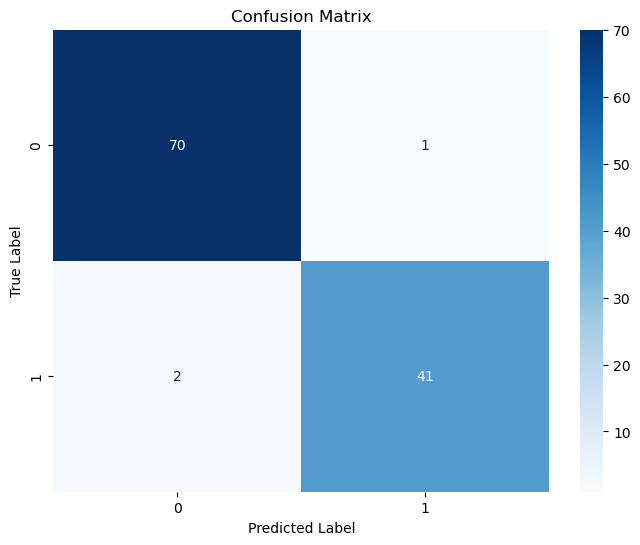

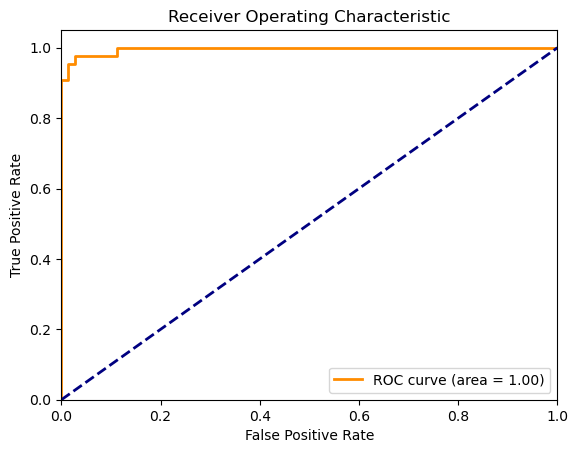

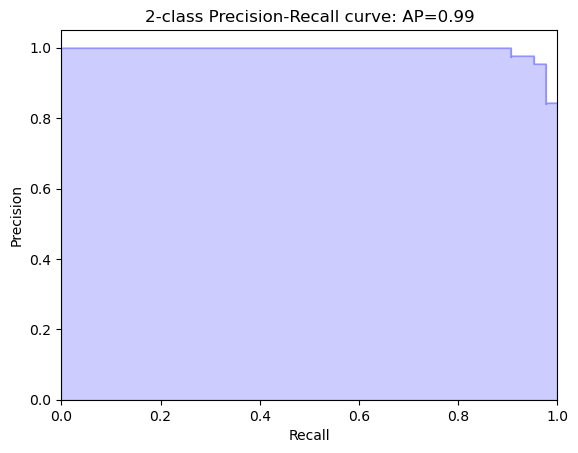

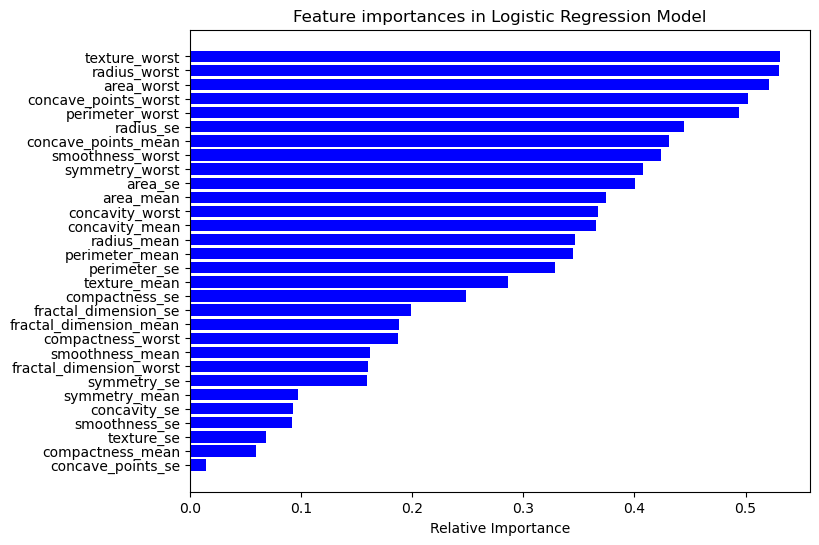

False Positives: 1
False Negatives: 2
False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count       1.0000      1.000000        1.000000    1.00000          1.00000   
mean        0.2438      0.676076        0.227689    0.11363         -0.78436   
std            NaN           NaN             NaN        NaN              NaN   
min         0.2438      0.676076        0.227689    0.11363         -0.78436   
25%         0.2438      0.676076        0.227689    0.11363         -0.78436   
50%         0.2438      0.676076        0.227689    0.11363         -0.78436   
75%         0.2438      0.676076        0.227689    0.11363         -0.78436   
max         0.2438      0.676076        0.227689    0.11363         -0.78436   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count          1.000000        1.000000             1.000000       1.000000   
mean          -0.029056       -0.245733 

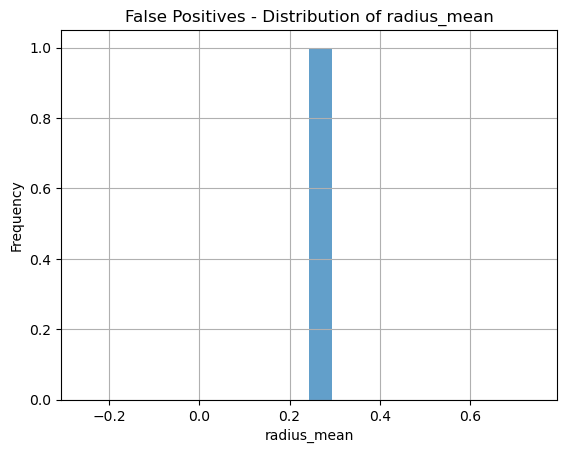

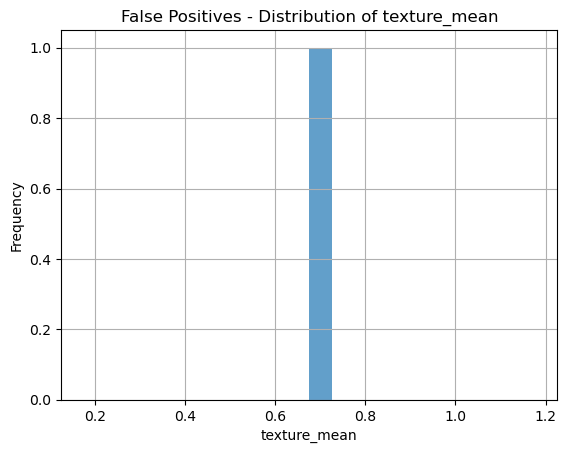

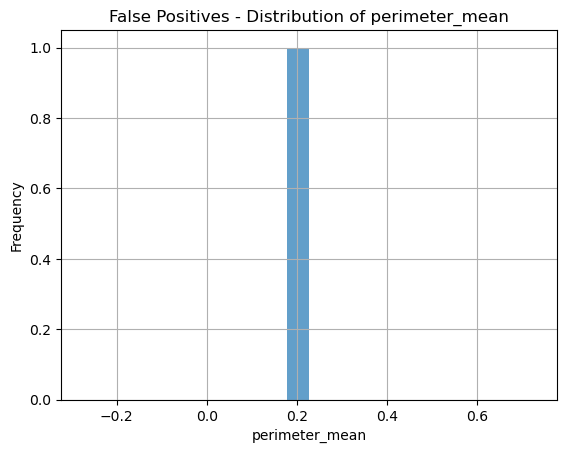

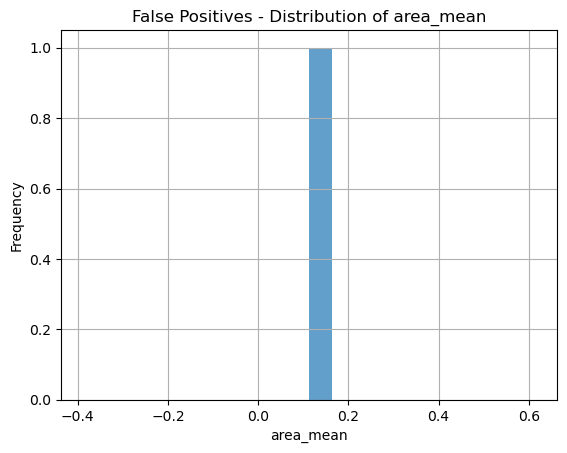

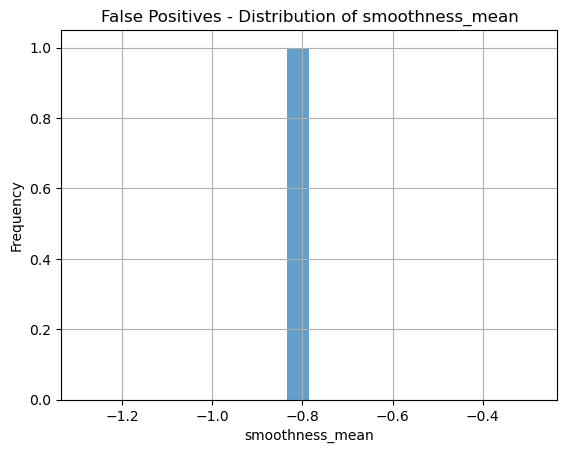

...

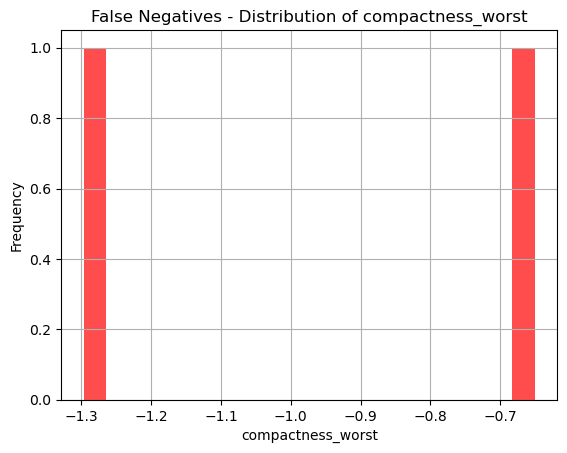

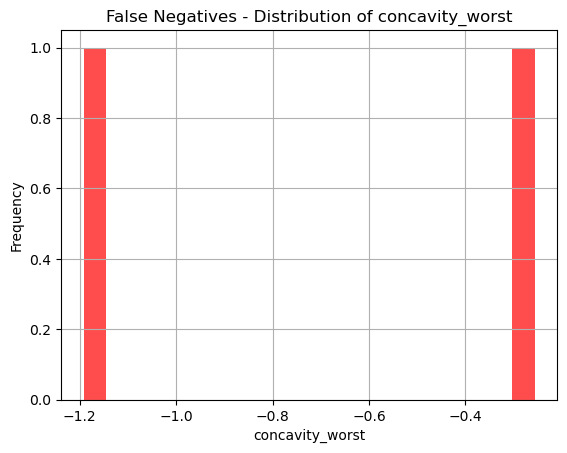

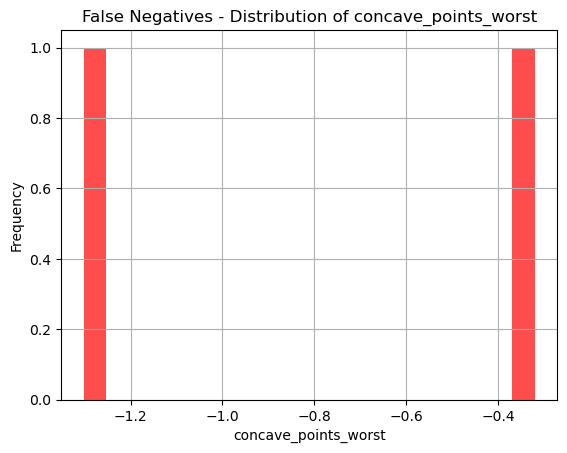

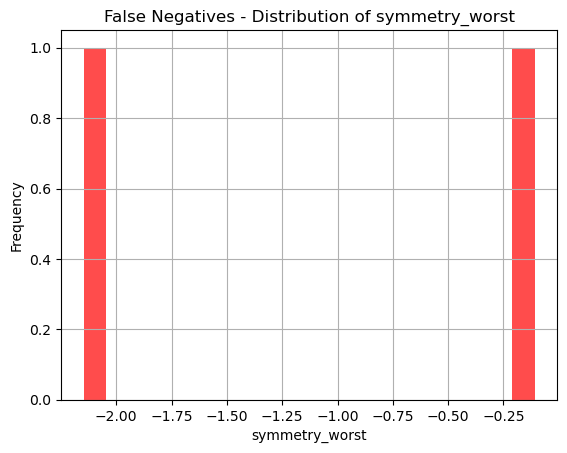

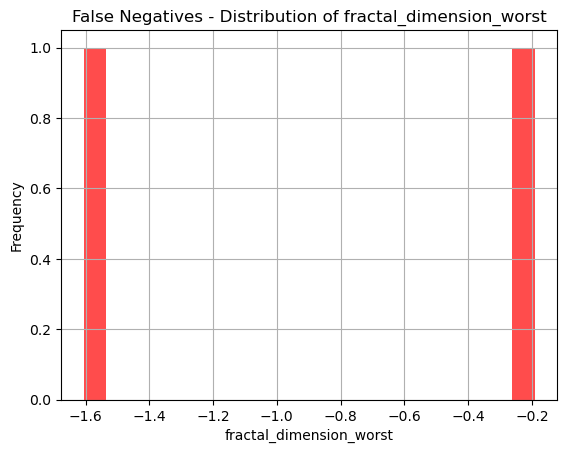

In [3]:
## Logistic Regression
# Define the parameter distribution to sample
param_distributions = {
    'C': uniform(0.1, 100),  # Regularization parameter
    'solver': ['newton-cg', 'lbfgs', 'liblinear'],
    'max_iter': randint(100, 20000)
    # Add other parameters and distributions here
}

# Create a base model
logreg = LogisticRegression()

# Instantiate the random search model
random_search = RandomizedSearchCV(estimator=logreg, param_distributions=param_distributions, n_iter=500, cv=10, verbose=0, random_state=0, n_jobs=-1)

# Fit the random search to the data
random_search.fit(X_train, Y_train)

# Best parameters found
print("Best parameters:", random_search.best_params_)

# Use the best parameters to fit the test set
best_logreg = random_search.best_estimator_

# Perform Cross-validation with the best model
cv_scores = cross_val_score(best_logreg, X_train, Y_train, cv=10)

# Print the cross-validation results
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", cv_scores.mean())



# Predict using the best model
Y_pred_logreg = best_logreg.predict(X_test)

# Creating the confusion Matrix and other metrics
cm_logreg = confusion_matrix(Y_test, Y_pred_logreg)
accuracy_logreg = accuracy_score(Y_test, Y_pred_logreg)
recall_logreg = recall_score(Y_test, Y_pred_logreg)
f1_logreg = f1_score(Y_test, Y_pred_logreg)

# Storing and printing results
model_results['Logistic Regression'] = {
    'Confusion Matrix': cm_logreg, 
    'Accuracy': accuracy_logreg, 
    'Recall': recall_logreg, 
    'F1 Score': f1_logreg
}


print("Logistic Regression Accuracy:", accuracy_logreg)
print("Logistic Regression Recall:", recall_logreg)
print("Logistic Regression F1 Score:", f1_logreg)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_logreg, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixLogreg.png")
plt.show()




# ROC Curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, _ = roc_curve(Y_test, best_logreg.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig("ROCLogreg.png")
plt.show()

# Precision-Recall Curve
from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, _ = precision_recall_curve(Y_test, best_logreg.predict_proba(X_test)[:, 1])
average_precision = average_precision_score(Y_test, best_logreg.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title(f'2-class Precision-Recall curve: AP={average_precision:.2f}')
# plt.savefig("PrecisionrecallLogreg.png")
plt.show()

# Feature Importance Plot

if 'liblinear' in best_logreg.get_params()['solver']:
    import numpy as np

    feature_importance = abs(best_logreg.coef_[0])

#     features = ['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3']  # Replace with your actual feature names
    features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']


    indices = np.argsort(feature_importance)

    plt.figure(figsize=(8, 6))
    plt.title("Feature importances in Logistic Regression Model")
    plt.barh(range(len(indices)), feature_importance[indices], color='b', align='center')
    plt.yticks(range(len(indices)), [features[i] for i in indices])
    plt.xlabel('Relative Importance')
#     plt.savefig("featureimportanceLogreg.png")
    plt.show()
    
# Calculate and print specific error rates
FP = cm_logreg[0, 1]  # False Positives
FN = cm_logreg[1, 0]  # False Negatives
print("False Positives:", FP)
print("False Negatives:", FN)



# Convert X_test to a DataFrame if it's not already
if isinstance(X_test, np.ndarray):
#     X_test_df = pd.DataFrame(X_test, columns=['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3'] )  
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_logreg == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_logreg == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
#     plt.savefig(f"FalsePositivesLogreg{column}.png")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
#     plt.savefig(f"FalseNegativesLogreg{column}.png")
    plt.show()




Best Parameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Cross-Validation Accuracy Scores: [0.97826087 0.97826087 0.95652174 0.97826087 0.97777778 0.97777778
 0.95555556 0.95555556 0.97777778 0.95555556]
Mean CV Accuracy: 0.9691304347826086
KNN Accuracy: 0.9649122807017544
KNN Recall: 0.9069767441860465
KNN F1 Score: 0.951219512195122


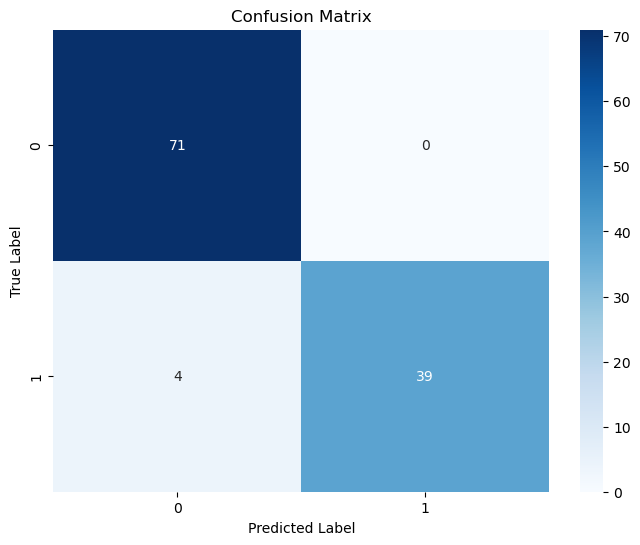

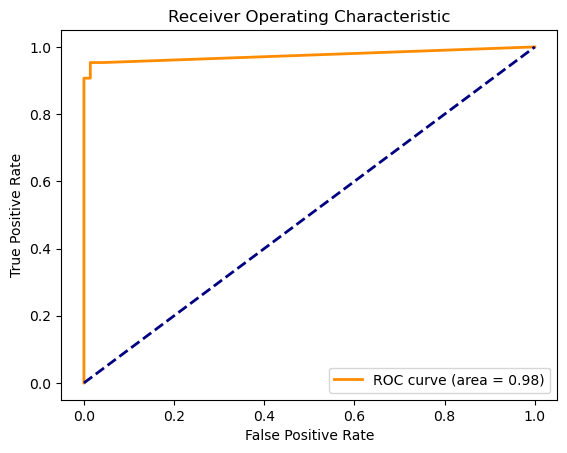

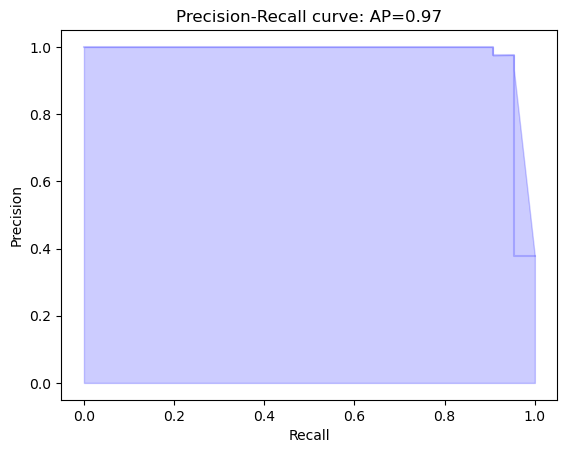

False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count          0.0           0.0             0.0        0.0              0.0   
mean           NaN           NaN             NaN        NaN              NaN   
std            NaN           NaN             NaN        NaN              NaN   
min            NaN           NaN             NaN        NaN              NaN   
25%            NaN           NaN             NaN        NaN              NaN   
50%            NaN           NaN             NaN        NaN              NaN   
75%            NaN           NaN             NaN        NaN              NaN   
max            NaN           NaN             NaN        NaN              NaN   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count               0.0             0.0                  0.0            0.0   
mean                NaN             NaN                  NaN            NaN   

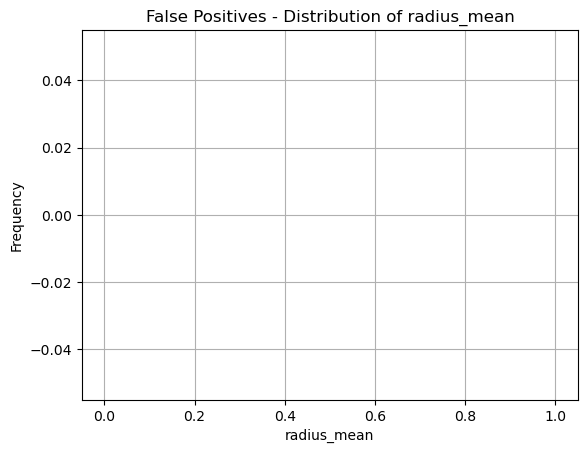

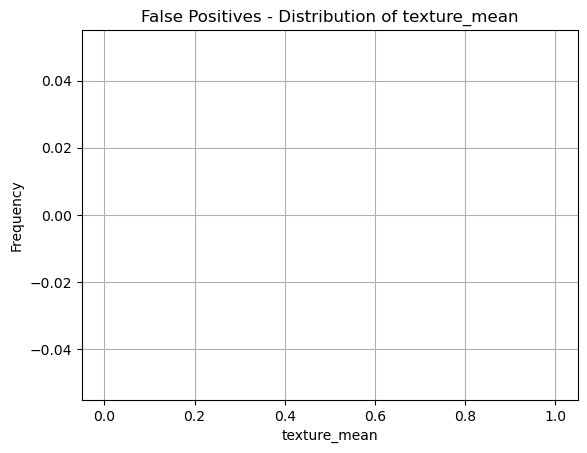

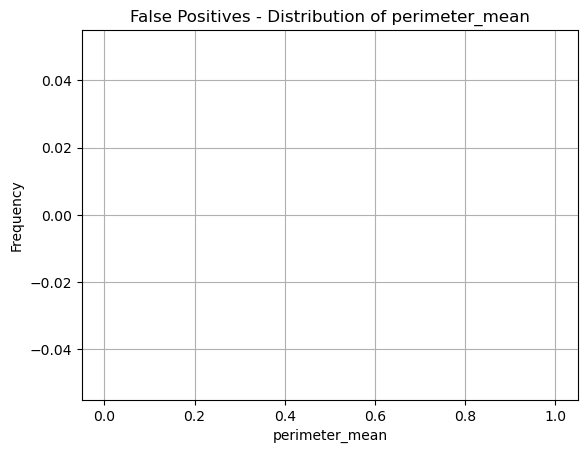

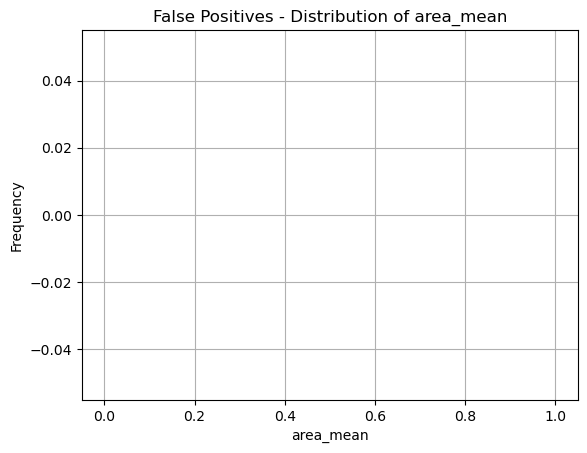

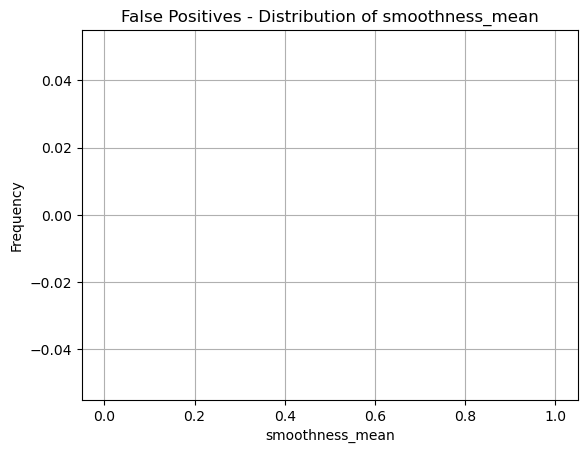

...

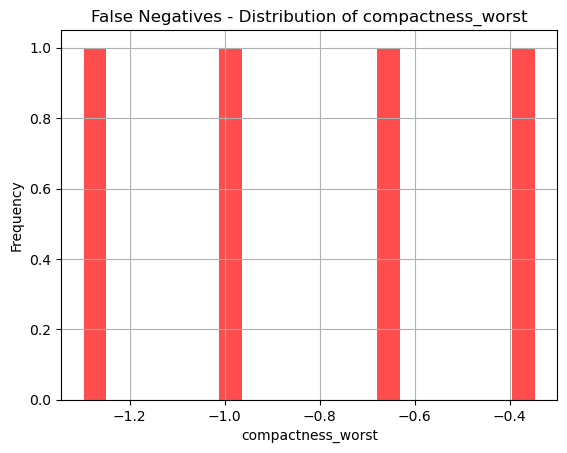

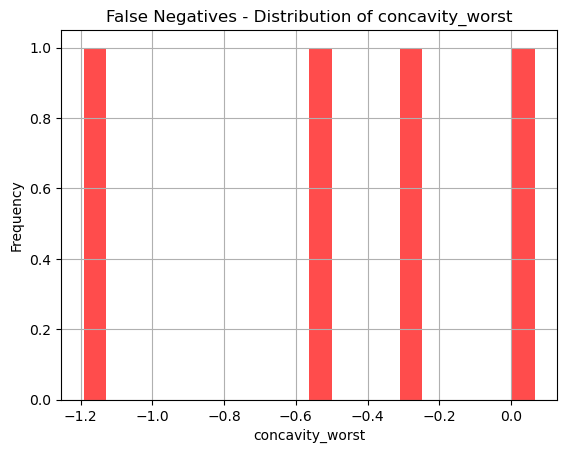

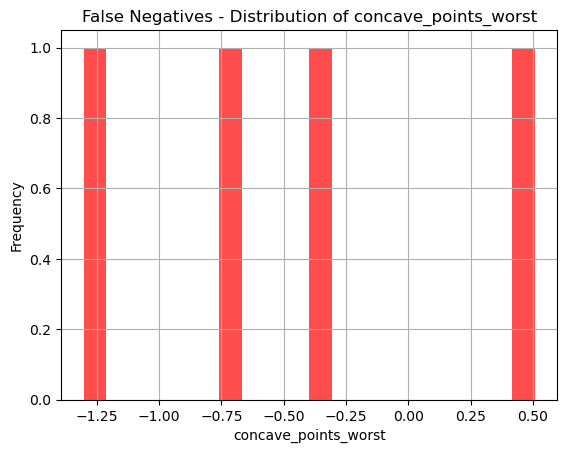

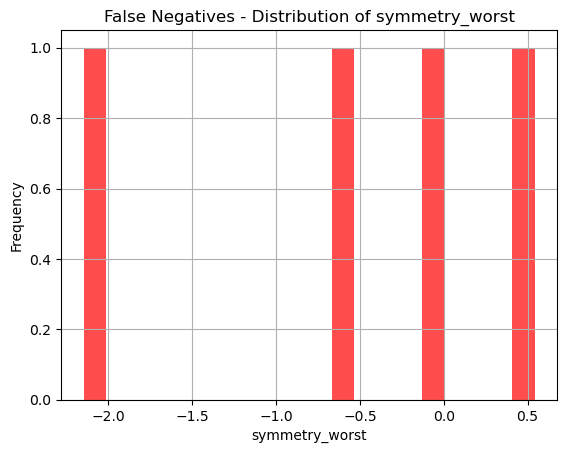

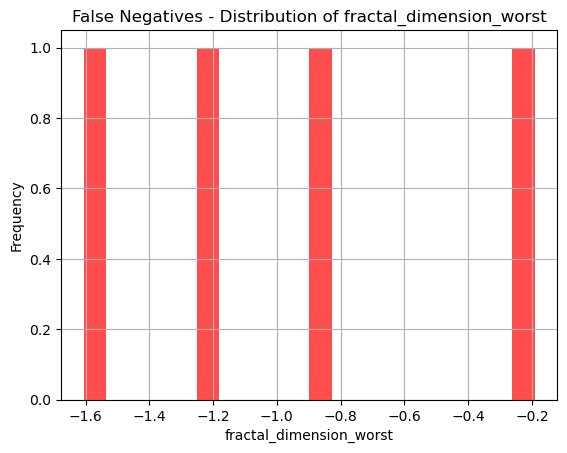

In [4]:
#Fitting K-NN Algorithm
from sklearn.neighbors import KNeighborsClassifier



# Define the parameter distributions
param_distributions = {
    'n_neighbors': randint(3, 20),  # Randomly sample number of neighbors
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metric
    'weights': ['distance']  # Weight function
   
}

# Create a KNN model
knn = KNeighborsClassifier()

# Instantiate RandomizedSearchCV
random_search = RandomizedSearchCV(knn, param_distributions, n_iter=500, cv=10, verbose=0, random_state=0, n_jobs=-1)

# Fit RandomizedSearchCV to the data
random_search.fit(X_train, Y_train)

# Best parameters found
print("Best Parameters:", random_search.best_params_)

# Use the best parameters to create a new KNN model
best_knn = random_search.best_estimator_

# Perform Cross-validation with the best model
cv_scores = cross_val_score(best_knn , X_train, Y_train, cv=10)

# cv_scores = cross_val_score(classifier_knn , X_train, Y_train, cv=10)

# Print the cross-validation results
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", cv_scores.mean())

# Predicting the Test set results
# Y_pred_knn = classifier_knn.predict(X_test)
Y_pred_knn = best_knn.predict(X_test)

# Creating the confusion Matrix
cm_knn = confusion_matrix(Y_test, Y_pred_knn)
accuracy_knn = accuracy_score(Y_test, Y_pred_knn)
recall_knn = recall_score(Y_test, Y_pred_knn)
f1_knn = f1_score(Y_test, Y_pred_knn)

# Storing results
model_results['K-NN'] = {
    'Confusion Matrix': cm_knn, 
    'Accuracy': accuracy_knn, 
    'Recall': recall_knn, 
    'F1 Score': f1_knn
}


print("KNN Accuracy:", accuracy_knn)
print("KNN Recall:", recall_knn)
print("KNN F1 Score:", f1_knn)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_knn, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixKNN.png")
plt.show()

from sklearn.metrics import roc_curve, auc

# Compute ROC curve for the best model
fpr, tpr, thresholds = roc_curve(Y_test, best_knn.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig("ROCKNN.png")
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, _ = precision_recall_curve(Y_test, best_knn.predict_proba(X_test)[:, 1])
average_precision = average_precision_score(Y_test, best_knn.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall, precision, where='post', color='b', alpha=0.2)
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall curve: AP={average_precision:.2f}')
# plt.savefig("precisionrecallKNN.png")
plt.show()

# Convert X_test to a DataFrame if it's not already
if isinstance(X_test, np.ndarray):
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_knn == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_knn == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()


#95.1 Acuracy

Best Parameters: {'C': 2.042558668422495, 'kernel': 'linear'}
Cross-Validation Accuracy Scores: [1.         1.         0.97826087 0.97826087 0.97777778 0.93333333
 0.97777778 0.95555556 1.         0.97777778]
Mean CV Accuracy: 0.9778743961352656
SVM Accuracy: 0.9473684210526315
SVM Recall: 0.9069767441860465
SVM F1 Score: 0.9285714285714286


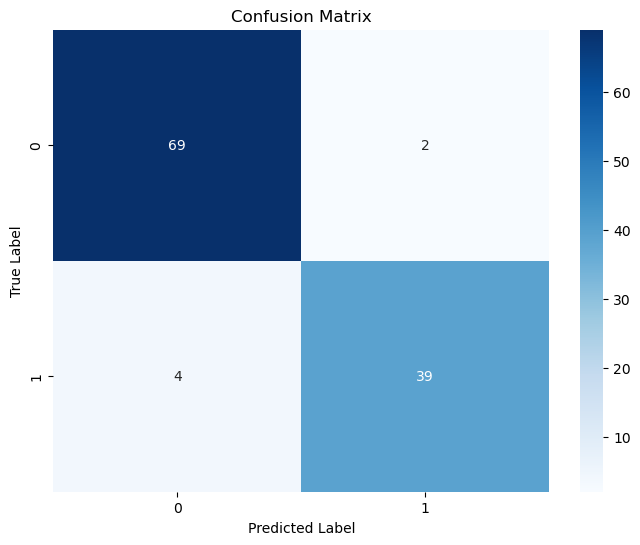

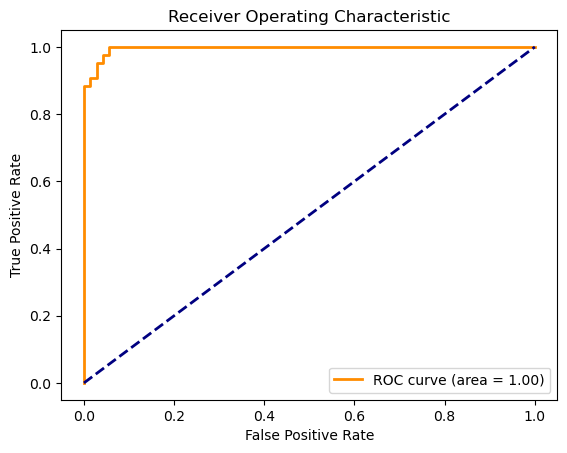

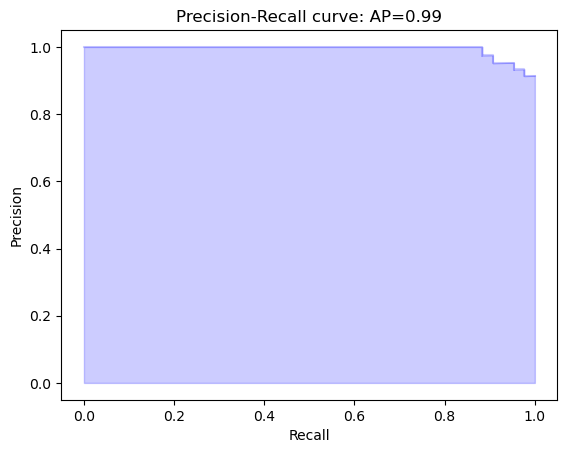

False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count     2.000000      2.000000        2.000000   2.000000         2.000000   
mean      0.149373     -0.352473        0.122002   0.036470        -0.287834   
std       0.133539      1.454588        0.149463   0.109121         0.702194   
min       0.054947     -1.381022        0.016316  -0.040690        -0.784360   
25%       0.102160     -0.866748        0.069159  -0.002110        -0.536097   
50%       0.149373     -0.352473        0.122002   0.036470        -0.287834   
75%       0.196586      0.161802        0.174845   0.075050        -0.039571   
max       0.243800      0.676076        0.227689   0.113630         0.208692   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count          2.000000        2.000000             2.000000       2.000000   
mean          -0.277548       -0.317814            -0.158944       0.744080   

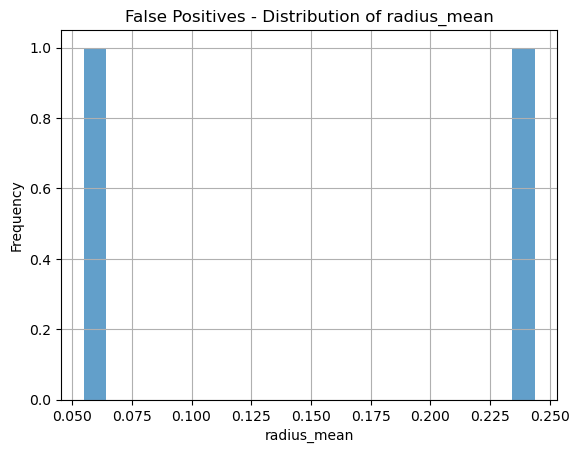

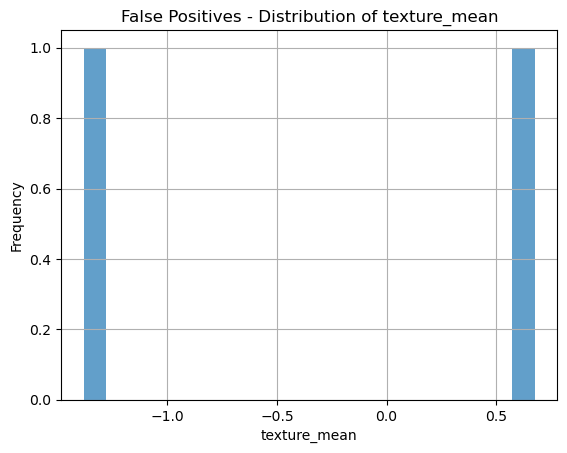

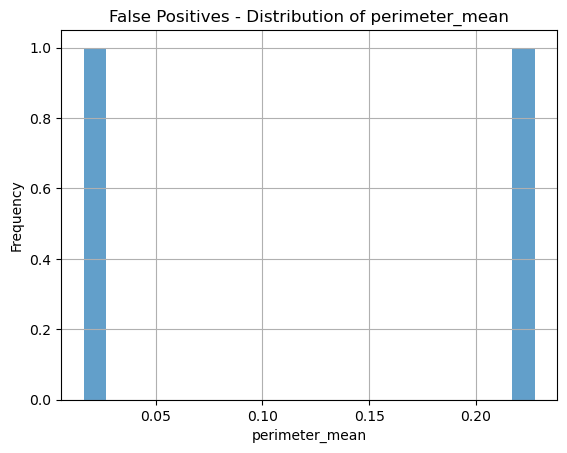

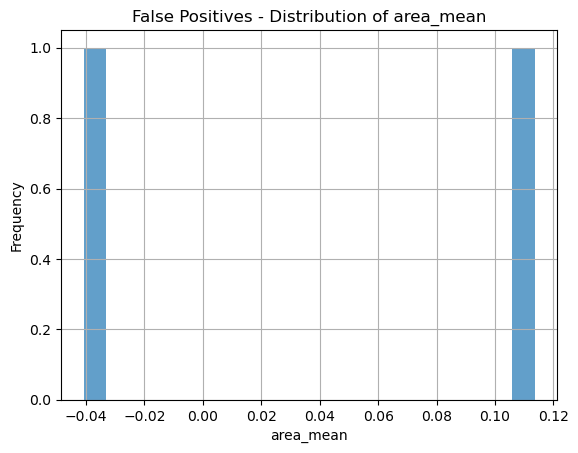

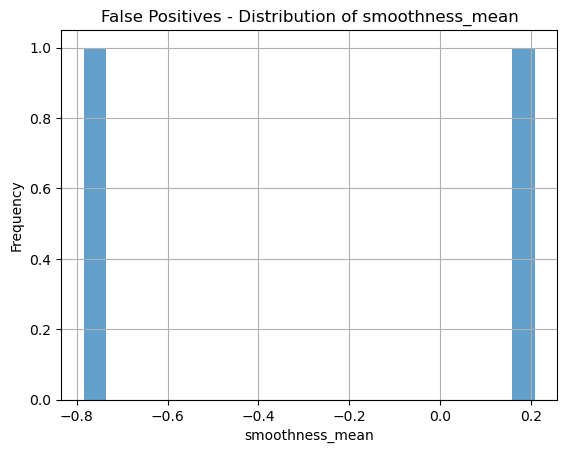

...

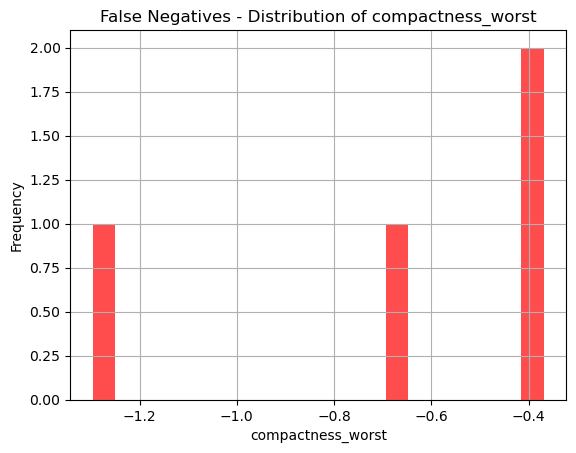

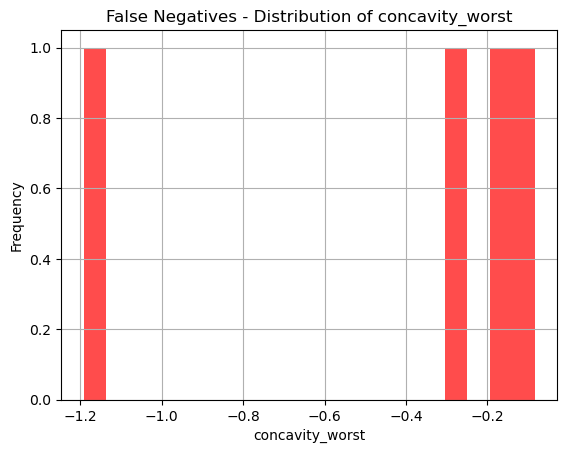

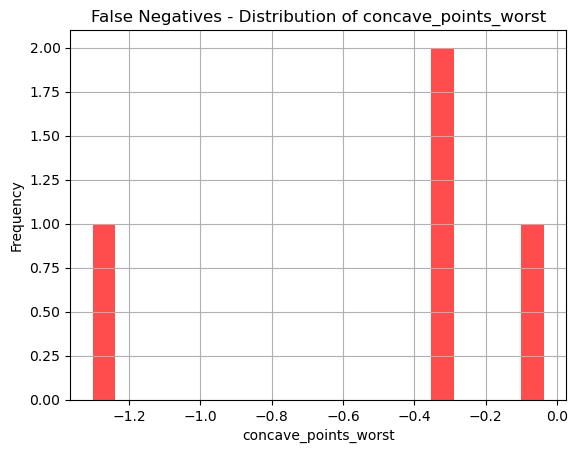

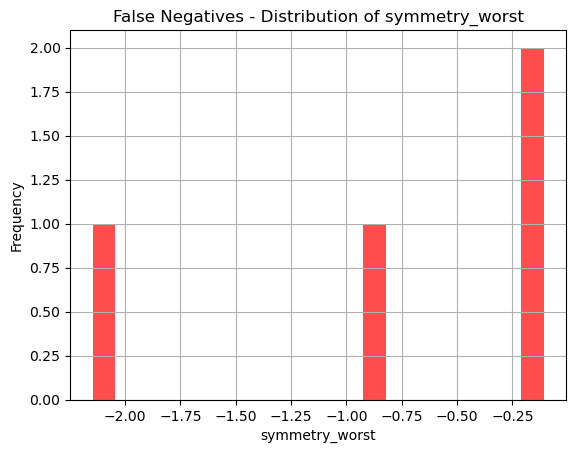

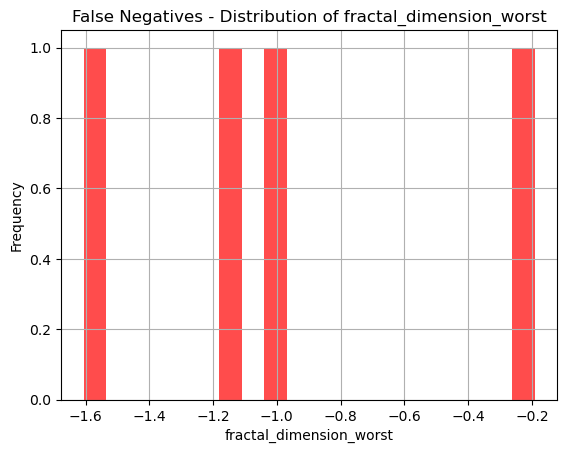

In [5]:
## SVM Linear kernel
from scipy.stats import expon

#Fitting SVM
from sklearn.svm import SVC
# classifier_svm = SVC(kernel = 'linear', random_state = 0)
# classifier_svm.fit(X_train, Y_train) 

# Define the parameter distributions
param_distributions = {
    'C': expon(scale=100),  # Regularization parameter
    'kernel': ['linear']  # Linear Kernel
}

# Create an SVM model
svm = SVC(random_state=0, probability=True)

# Instantiate RandomizedSearchCV
random_search_svm = RandomizedSearchCV(svm, param_distributions, n_iter=500, cv=10, verbose=0, random_state=0, n_jobs=-1)

# Fit RandomizedSearchCV to the data
random_search_svm.fit(X_train, Y_train)

# Best parameters found
print("Best Parameters:", random_search_svm.best_params_)

# Use the best parameters to create a new SVM model
best_svm = random_search_svm.best_estimator_

cv_scores_svm = cross_val_score(best_svm, X_train, Y_train, cv=10)
print("Cross-Validation Accuracy Scores:", cv_scores_svm)
print("Mean CV Accuracy:", cv_scores_svm.mean())



Y_pred_svm = best_svm.predict(X_test)

# Creating the confusion Matrix
cm_svm = confusion_matrix(Y_test, Y_pred_svm)
accuracy_svm = accuracy_score(Y_test, Y_pred_svm)
recall_svm = recall_score(Y_test, Y_pred_svm)
f1_svm = f1_score(Y_test, Y_pred_svm)

# Storing results
model_results['SVM'] = {
    'Confusion Matrix': cm_svm, 
    'Accuracy': accuracy_svm, 
    'Recall': recall_svm, 
    'F1 Score': f1_svm
}



# print("Logistic Regression Confusion Matrix:\n", cm_logreg)
print("SVM Accuracy:", accuracy_svm)
print("SVM Recall:", recall_svm)
print("SVM F1 Score:", f1_svm)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixSVM.png")
plt.show()

# Compute ROC curve for the best model
fpr, tpr, thresholds = roc_curve(Y_test, best_svm.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig("ROCsvm.png")
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, _ = precision_recall_curve(Y_test, best_svm.predict_proba(X_test)[:, 1])
average_precision = average_precision_score(Y_test, best_svm.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall, precision, where='post', color='b', alpha=0.2)
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall curve: AP={average_precision:.2f}')
# plt.savefig("precisionrecallSvm.png")
plt.show()

# Convert X_test to a DataFrame if it's not already
if isinstance(X_test, np.ndarray):
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_svm == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_svm == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()



Best Parameters: {'C': 7.368535491284788, 'gamma': 0.014936835544198454}
Cross-Validation Accuracy Scores: [0.97826087 1.         0.97826087 0.95652174 0.97777778 0.95555556
 0.97777778 1.         0.97777778 0.97777778]
Mean CV Accuracy: 0.9779710144927536
RBF Accuracy: 0.956140350877193
RBF Recall: 0.9069767441860465
RBF F1 Score: 0.9397590361445783


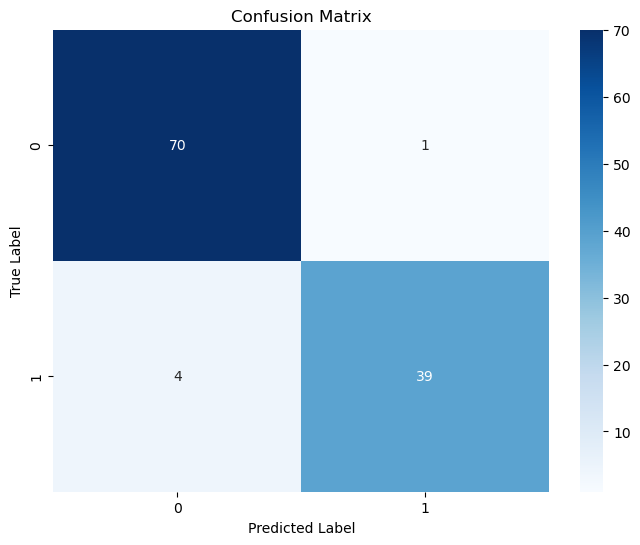

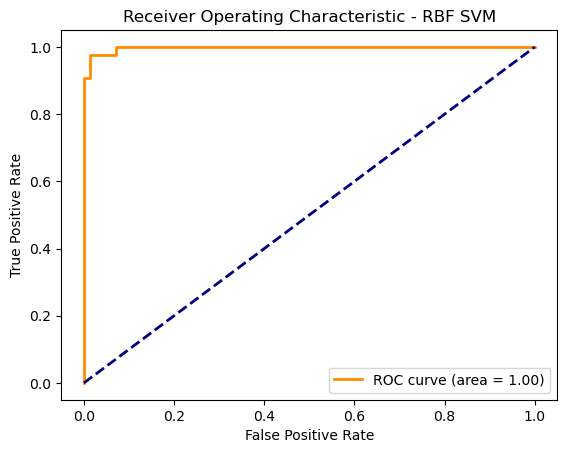

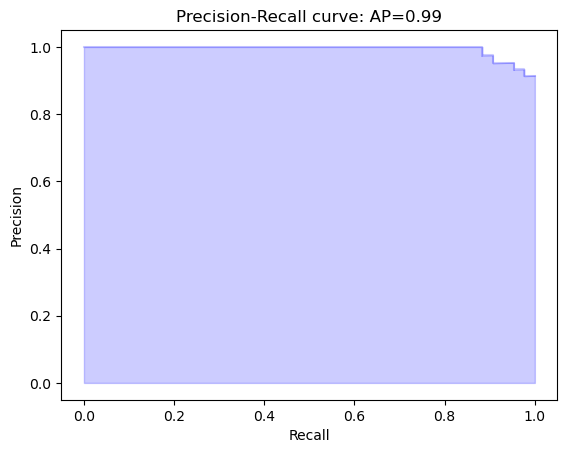

False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count     1.000000      1.000000        1.000000   1.000000         1.000000   
mean     -0.200731     -0.123907       -0.197163  -0.305532         0.811234   
std            NaN           NaN             NaN        NaN              NaN   
min      -0.200731     -0.123907       -0.197163  -0.305532         0.811234   
25%      -0.200731     -0.123907       -0.197163  -0.305532         0.811234   
50%      -0.200731     -0.123907       -0.197163  -0.305532         0.811234   
75%      -0.200731     -0.123907       -0.197163  -0.305532         0.811234   
max      -0.200731     -0.123907       -0.197163  -0.305532         0.811234   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count          1.000000        1.000000             1.000000       1.000000   
mean           0.184802       -0.583338            -0.443785      -0.296555   

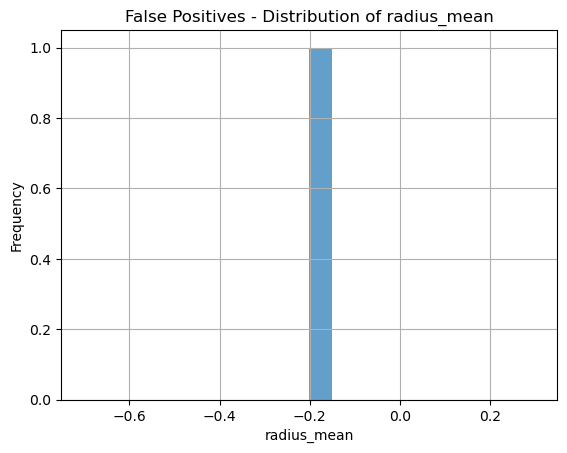

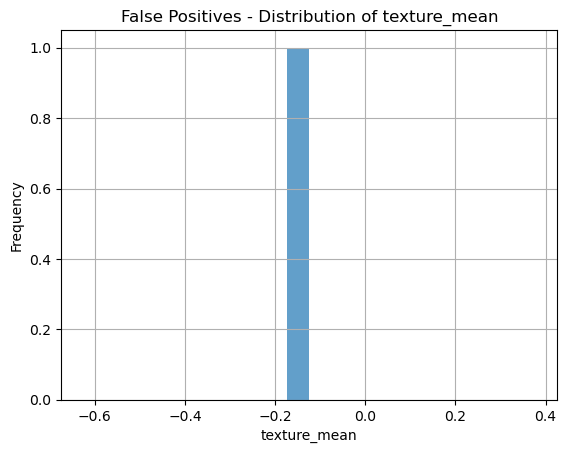

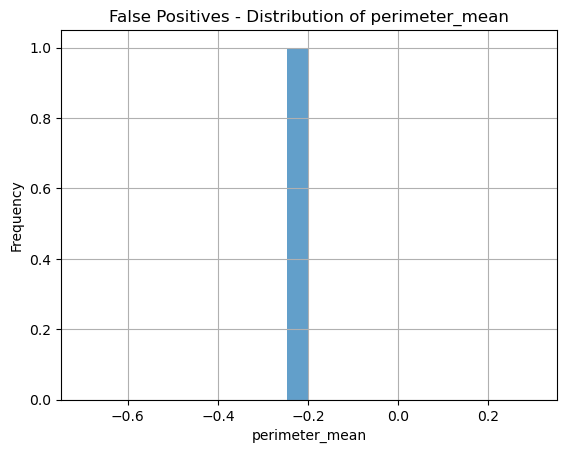

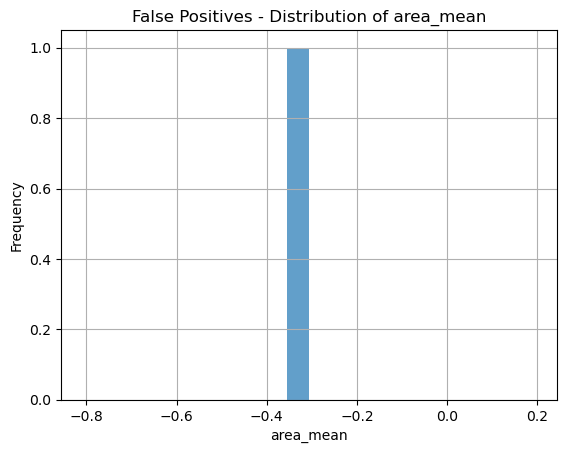

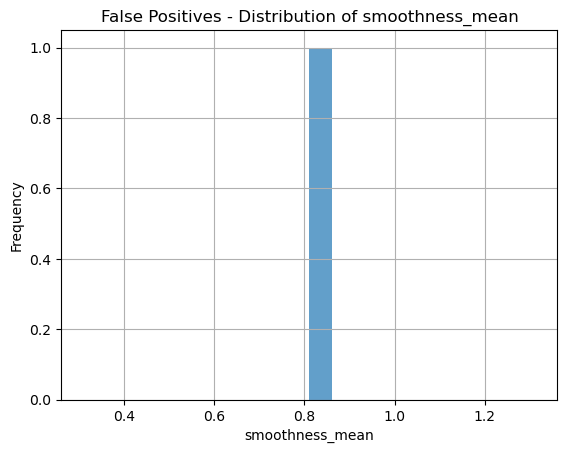

...

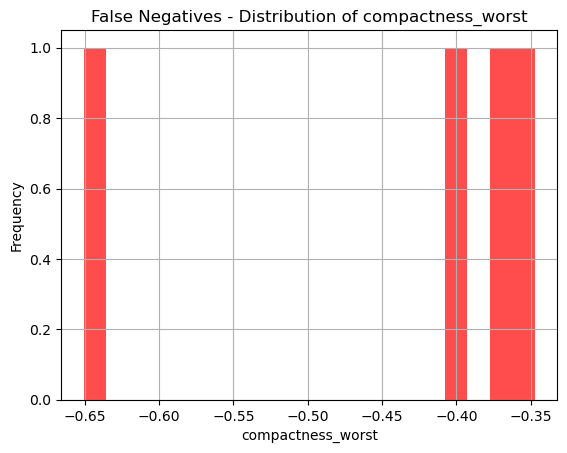

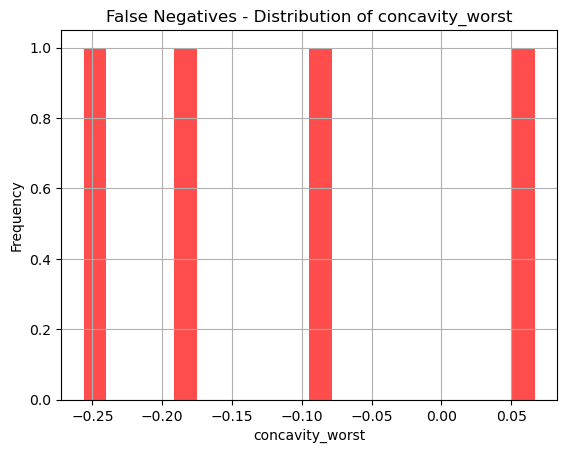

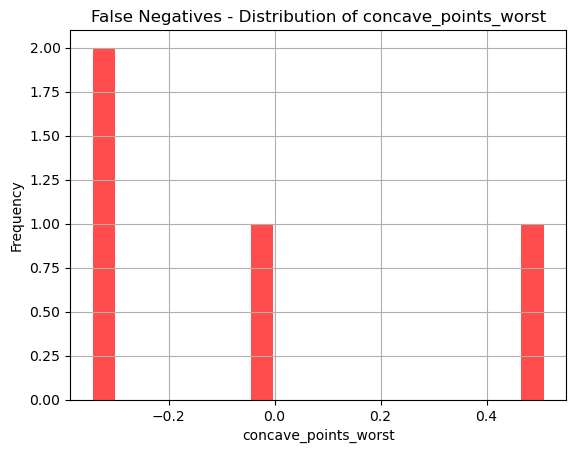

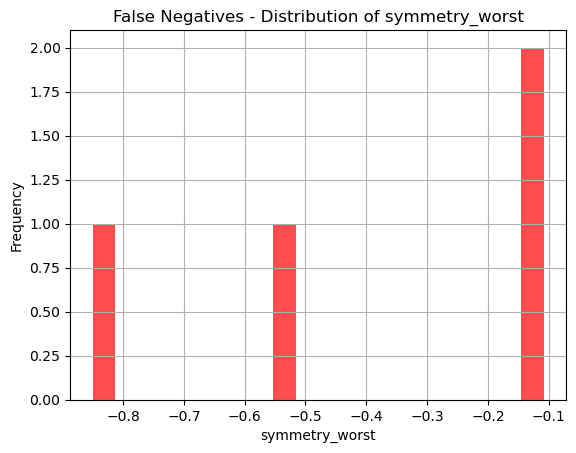

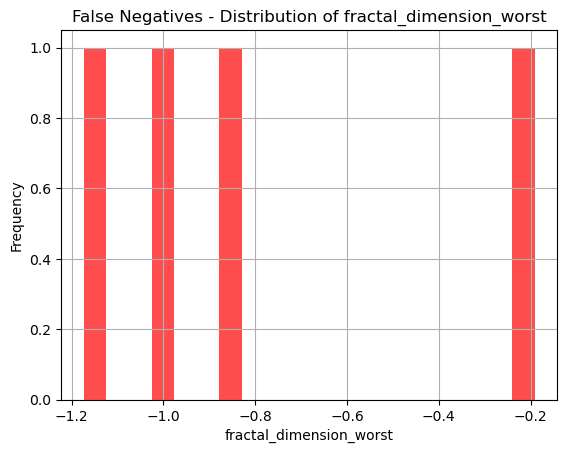

In [6]:
## SVM RBF
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import expon, reciprocal
from sklearn.metrics import roc_curve, auc



#Fitting K-SVM
# # from sklearn.svm import SVC
# classifier_rbf = SVC(kernel = 'rbf', random_state = 0)
# classifier_rbf.fit(X_train, Y_train)

# Define the parameter distributions
param_distributions = {
    'C': expon(scale=100),  # Regularization parameter
    'gamma': reciprocal(0.01, 1.0),  # Kernel coefficient
}

# Create an RBF SVM model
svm_rbf = SVC(kernel='rbf', probability=True, random_state=0)

# Instantiate RandomizedSearchCV
random_search_rbf = RandomizedSearchCV(svm_rbf, param_distributions, n_iter=100, cv=10, verbose=0, random_state=0, n_jobs=-1)

# Fit RandomizedSearchCV to the data
random_search_rbf.fit(X_train, Y_train)

# Best parameters found
print("Best Parameters:", random_search_rbf.best_params_)

# Use the best parameters to create a new RBF SVM model
best_rbf = random_search_rbf.best_estimator_


# Perform cross-validation
cv_scores_rbf = cross_val_score(best_rbf, X_train, Y_train, cv=10)

# Print the cross-validation results
print("Cross-Validation Accuracy Scores:", cv_scores_rbf)
print("Mean CV Accuracy:", cv_scores_rbf.mean())

# Predicting the Test set results
# Y_pred_rbf = classifier_rbf.predict(X_test)

Y_pred_rbf = best_rbf.predict(X_test)


# Creating the confusion Matrix
cm_rbf = confusion_matrix(Y_test, Y_pred_rbf)
accuracy_rbf = accuracy_score(Y_test, Y_pred_rbf)
recall_rbf = recall_score(Y_test, Y_pred_rbf)
f1_rbf = f1_score(Y_test, Y_pred_rbf)

# Storing results
model_results['RBF'] = {
    'Confusion Matrix': cm_rbf, 
    'Accuracy': accuracy_rbf, 
    'Recall': recall_rbf, 
    'F1 Score': f1_rbf
}


print("RBF Accuracy:", accuracy_rbf)
print("RBF Recall:", recall_rbf)
print("RBF F1 Score:", f1_rbf)


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_rbf, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixRbf.png")
plt.show()

# Compute ROC curve for the best model
fpr, tpr, thresholds = roc_curve(Y_test, best_rbf.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - RBF SVM')
plt.legend(loc="lower right")
# plt.savefig("RocRbf.png")
plt.show()


from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, _ = precision_recall_curve(Y_test, best_svm.predict_proba(X_test)[:, 1])
average_precision = average_precision_score(Y_test, best_svm.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall, precision, where='post', color='b', alpha=0.2)
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title(f'Precision-Recall curve: AP={average_precision:.2f}')
# plt.savefig("precisionrecallRbf.png")
plt.show()


if isinstance(X_test, np.ndarray):
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_rbf == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_rbf == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()



#

Cross-Validation Accuracy Scores: [0.95652174 0.97826087 0.95652174 0.91304348 0.95555556 0.91111111
 0.91111111 0.88888889 0.97777778 0.86666667]
Mean CV Accuracy: 0.9315458937198068
Naive Bayes Accuracy: 0.9298245614035088
Naive Bayes Recall: 0.8837209302325582
Naive Bayes F1 Score: 0.9047619047619047


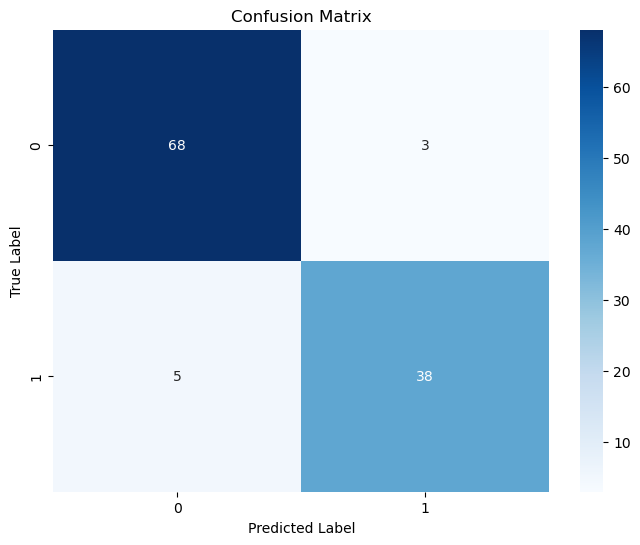

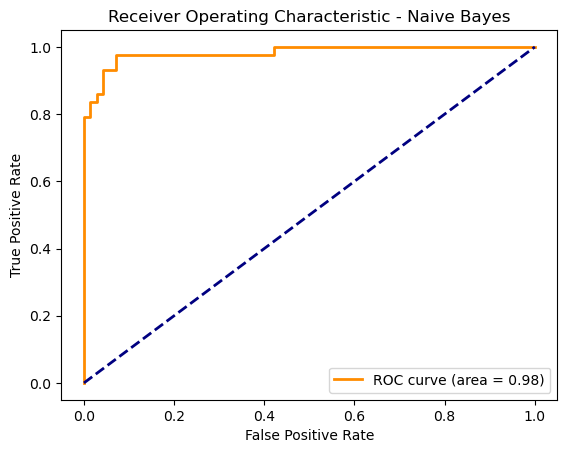

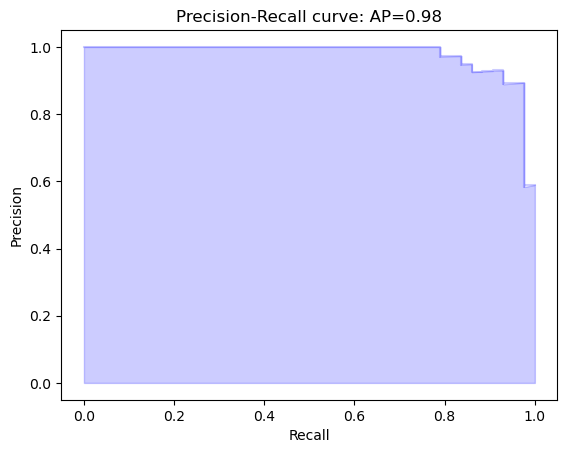

False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count     3.000000      3.000000        3.000000   3.000000         3.000000   
mean     -0.289250     -1.134996       -0.202777  -0.354718         1.313352   
std       0.877486      0.401663        0.845986   0.667161         0.800102   
min      -1.300146     -1.459592       -1.179078  -1.124456         0.497112   
25%      -0.571755     -1.359594       -0.461168  -0.560674         0.921890   
50%       0.156637     -1.259596        0.256742   0.003108         1.346668   
75%       0.216198     -0.972698        0.285374   0.030150         1.721472   
max       0.275759     -0.685799        0.314006   0.057193         2.096275   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count          3.000000        3.000000             3.000000       3.000000   
mean           1.719661        0.481765             0.640228       0.883921   

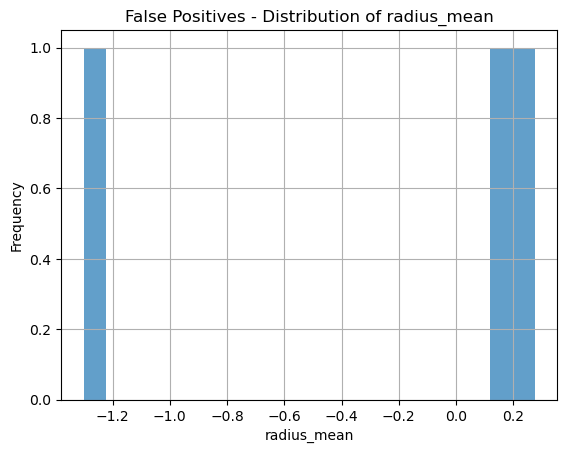

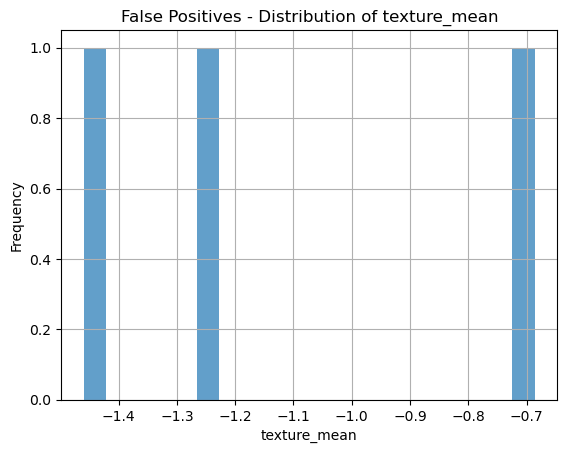

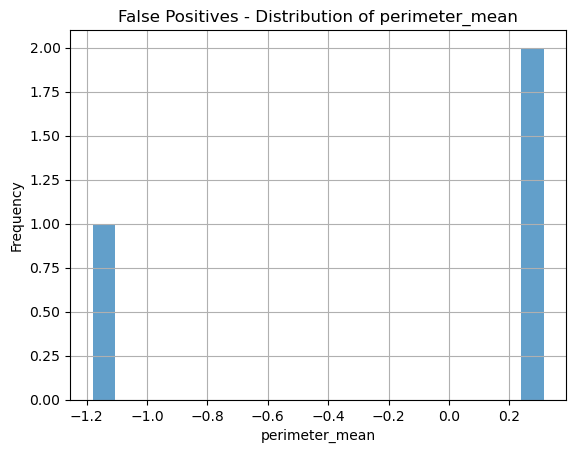

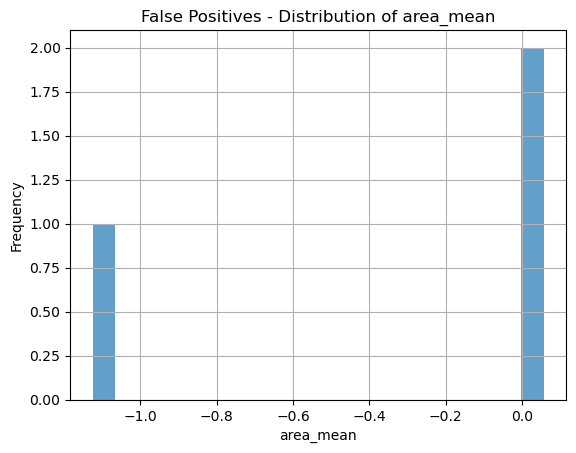

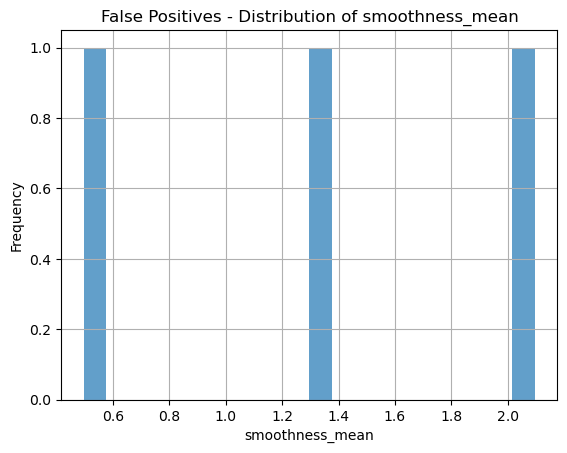

...

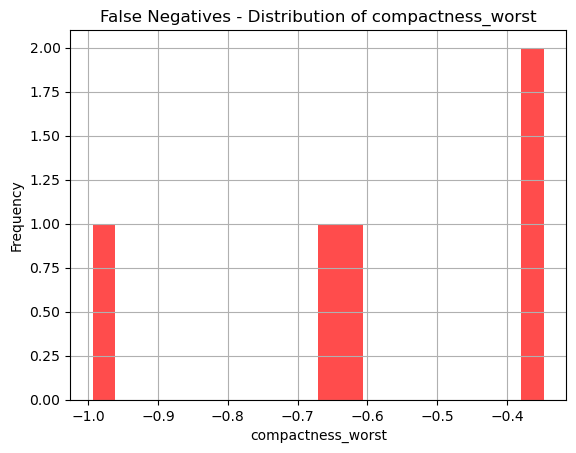

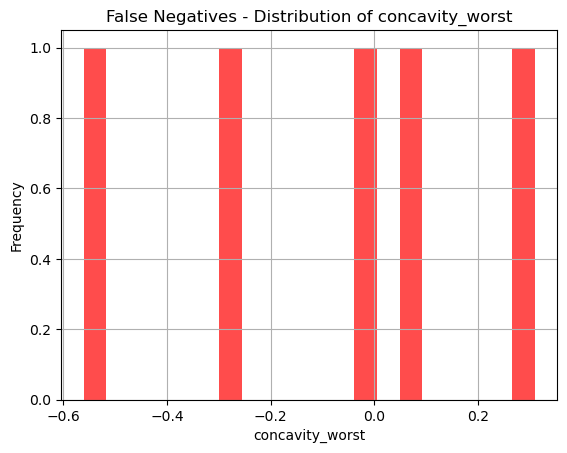

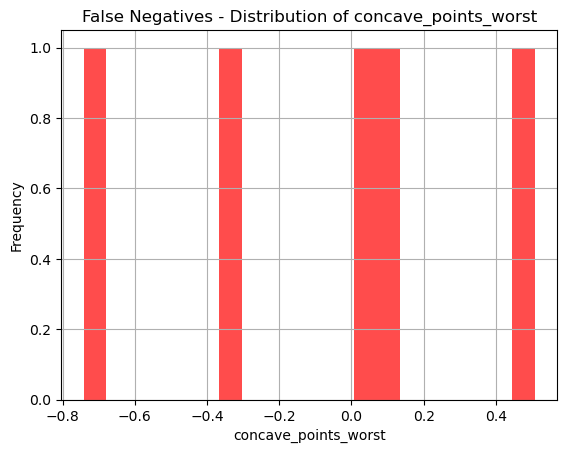

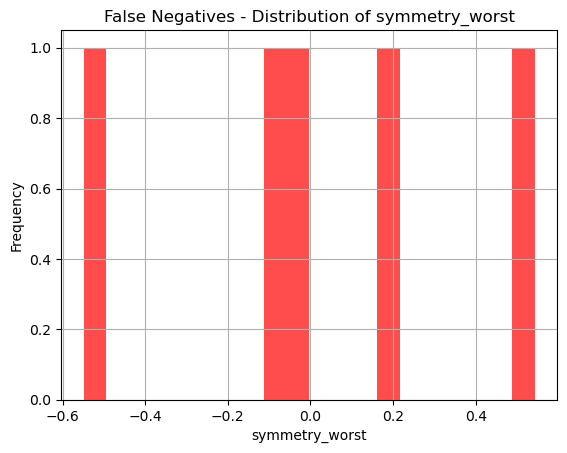

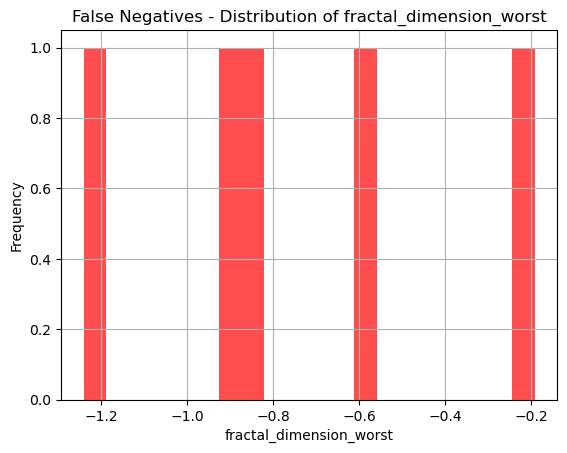

In [7]:
## Naive Bayes
from sklearn.metrics import precision_recall_curve, average_precision_score


#Fitting Naive_Bayes
from sklearn.naive_bayes import GaussianNB
classifier_NB = GaussianNB()
classifier_NB.fit(X_train, Y_train)
#91.6 Acuracy

# Predicting the Test set results
Y_pred_NB = classifier_NB.predict(X_test)


# Perform cross-validation
cv_scores_NB = cross_val_score(classifier_NB, X_train, Y_train, cv=10)

# Print the cross-validation results
print("Cross-Validation Accuracy Scores:", cv_scores_NB)
print("Mean CV Accuracy:", cv_scores_NB.mean())

# Creating the confusion Matrix
cm_NB = confusion_matrix(Y_test, Y_pred_NB)
accuracy_NB = accuracy_score(Y_test, Y_pred_NB)
recall_NB = recall_score(Y_test, Y_pred_NB)
f1_NB = f1_score(Y_test, Y_pred_NB)

# Storing results
model_results['Naive Bayes'] = {
    'Confusion Matrix': cm_NB, 
    'Accuracy': accuracy_NB, 
    'Recall': recall_NB, 
    'F1 Score': f1_NB
}



# print("Logistic Regression Confusion Matrix:\n", cm_logreg)
print("Naive Bayes Accuracy:", accuracy_NB)
print("Naive Bayes Recall:", recall_NB)
print("Naive Bayes F1 Score:", f1_NB)


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_NB, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixNB.png")
plt.show()

# Compute ROC curve for the best model
fpr_NB, tpr_NB, thresholds_NB = roc_curve(Y_test, classifier_NB.predict_proba(X_test)[:, 1])
roc_auc_NB = auc(fpr_NB, tpr_NB)

# Plot ROC Curve
plt.figure()
plt.plot(fpr_NB, tpr_NB, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_NB)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Naive Bayes')
plt.legend(loc="lower right")
# plt.savefig("RocNB.png")
plt.show()

# precision recall
precision_NB, recall_NB, _ = precision_recall_curve(Y_test, classifier_NB.predict_proba(X_test)[:, 1])
average_precision_NB = average_precision_score(Y_test, classifier_NB.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall_NB, precision_NB, where='post', color='b', alpha=0.2)
plt.fill_between(recall_NB, precision_NB, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve: AP={0:0.2f}'.format(average_precision_NB))
# plt.savefig("PrecisionrecallNB.png")
plt.show()

# Convert X_test to a DataFrame if it's not already
if isinstance(X_test, np.ndarray):
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_NB == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_NB == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
#     plt.savefig(f"FalsePositivesNB{column}.png")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
#     plt.savefig(f"FalsenegativeNB{column}.png")
    plt.show()


Fitting 10 folds for each of 54 candidates, totalling 540 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
Decision Tree Accuracy: 0.9122807017543859
Decision Tree Recall: 0.8604651162790697
Decision Tree F1 Score: 0.8809523809523809


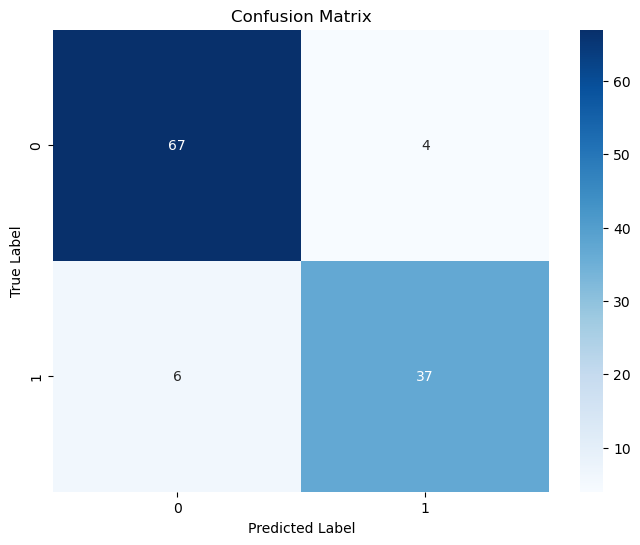

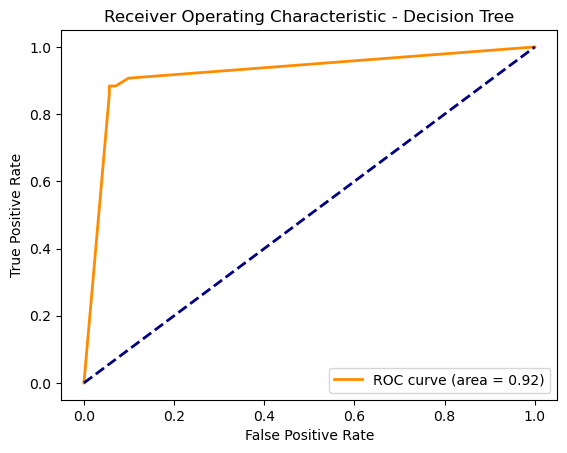

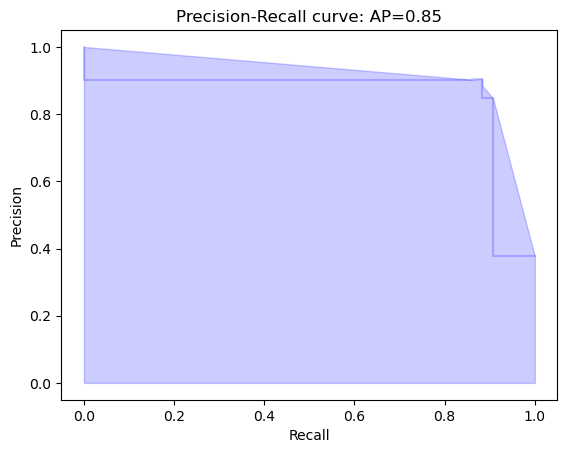

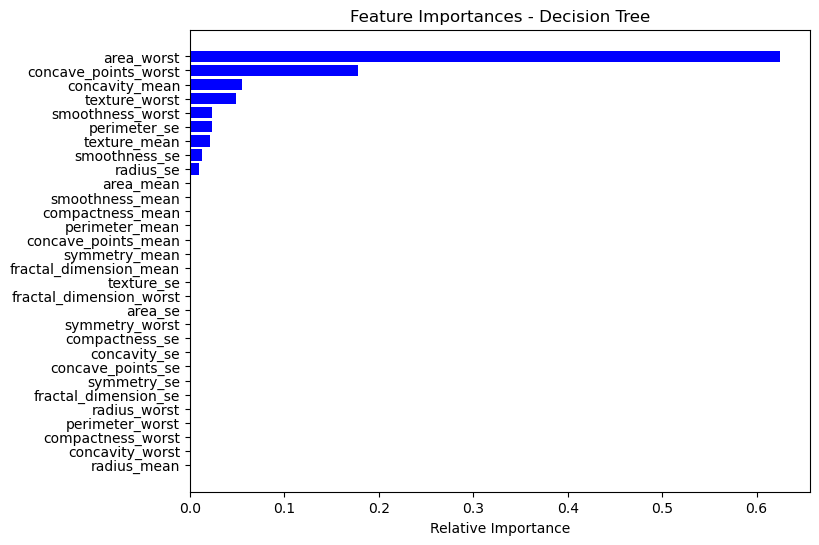

False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count     4.000000      4.000000        4.000000   4.000000         4.000000   
mean     -0.232691     -0.677466       -0.197899  -0.296640         0.566183   
std       0.697493      0.432663        0.656145   0.568075         1.019453   
min      -0.924184     -1.271501       -0.858650  -0.833453        -0.498795   
25%      -0.782544     -0.832225       -0.711805  -0.751222        -0.205913   
50%      -0.229786     -0.589373       -0.174425  -0.333310         0.619191   
75%       0.320067     -0.434614        0.339480   0.121273         1.391287   
max       0.452991     -0.259618        0.415903   0.313511         1.525146   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count          4.000000        4.000000             4.000000       4.000000   
mean           0.561988        0.095175             0.278861       0.040335   

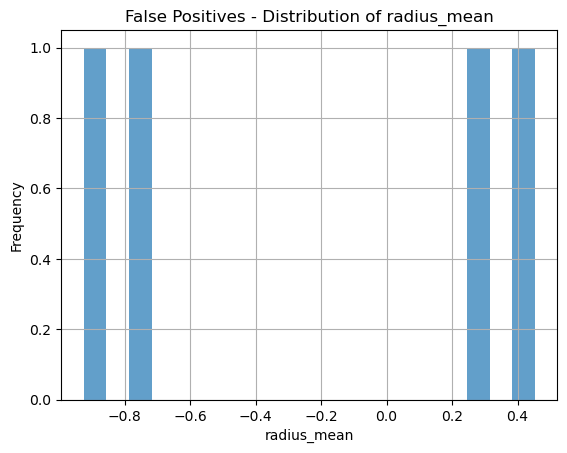

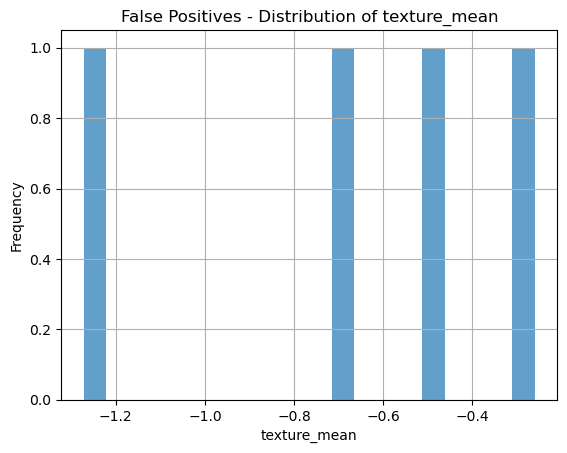

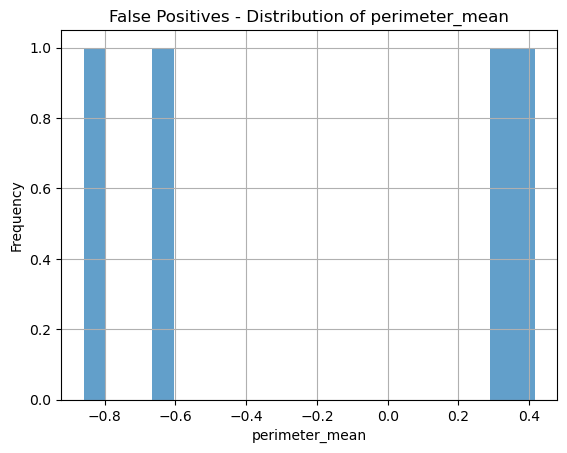

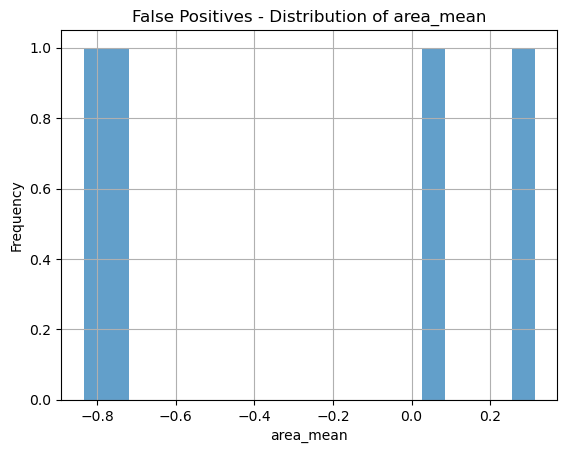

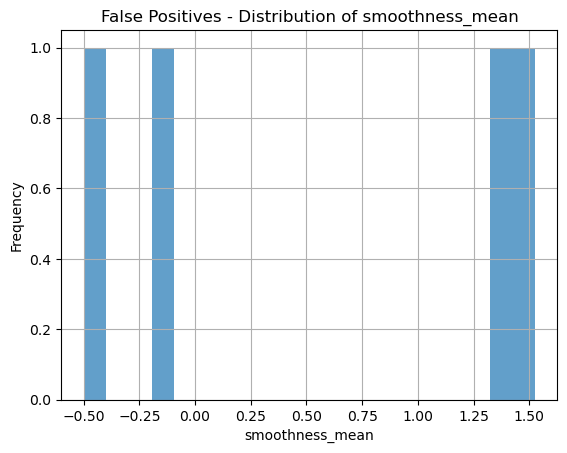

...

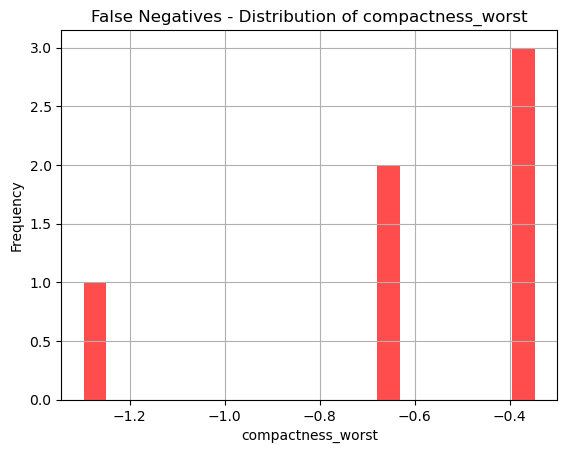

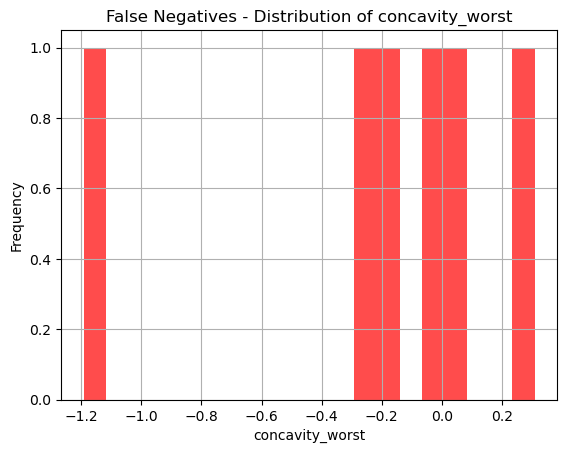

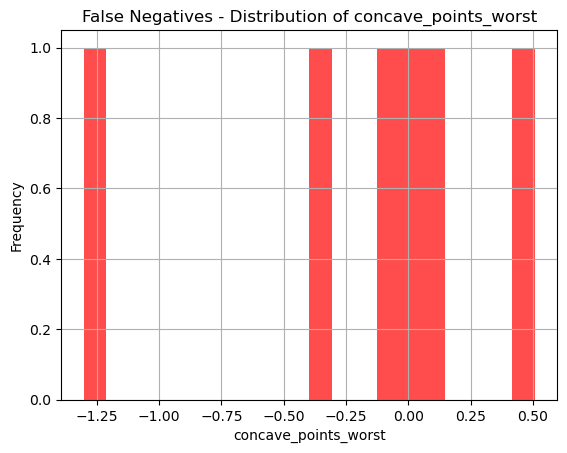

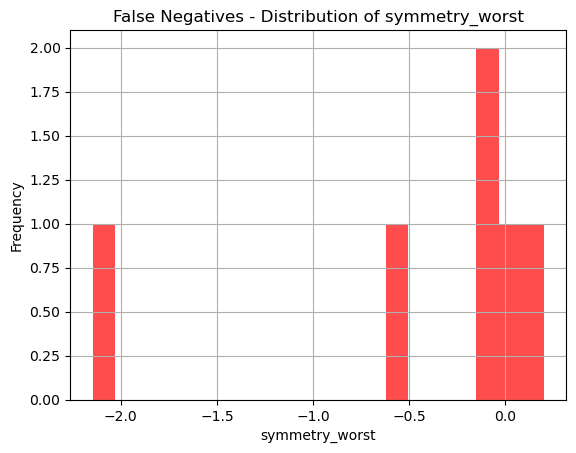

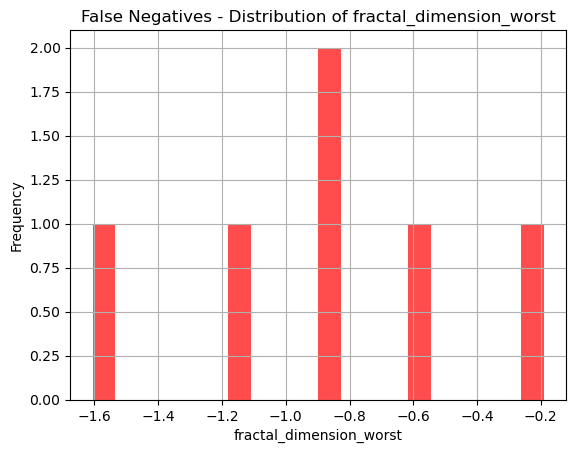

In [8]:
## Decision Tree
from sklearn.model_selection import GridSearchCV

#Fitting Decision Tree Algorithm
from sklearn.tree import DecisionTreeClassifier
# classifier_DT = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
# classifier_DT.fit(X_train, Y_train)
#95.8 Acuracy

# Define the parameter grid
param_grid_DT = {
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Decision Tree model
DT = DecisionTreeClassifier(criterion='entropy', random_state=0)

# Instantiate GridSearchCV
grid_search_DT = GridSearchCV(DT, param_grid_DT, cv=10, n_jobs=-1, verbose=2)

# Fit GridSearchCV to the data
grid_search_DT.fit(X_train, Y_train)

# Best parameters found
print("Best Parameters:", grid_search_DT.best_params_)

# Use the best parameters to create a new Decision Tree model
best_DT = grid_search_DT.best_estimator_

# Predicting the Test set results
# Y_pred_DT = classifier_DT.predict(X_test)

Y_pred_DT = best_DT.predict(X_test)

# Creating the confusion Matrix
cm_DT = confusion_matrix(Y_test, Y_pred_DT)
accuracy_DT = accuracy_score(Y_test, Y_pred_DT)
recall_DT = recall_score(Y_test, Y_pred_DT)
f1_DT = f1_score(Y_test, Y_pred_DT)

# Storing results
model_results['Decision Tree'] = {
    'Confusion Matrix': cm_DT, 
    'Accuracy': accuracy_DT, 
    'Recall': recall_DT, 
    'F1 Score': f1_DT
}



# print("Logistic Regression Confusion Matrix:\n", cm_logreg)
print("Decision Tree Accuracy:", accuracy_DT)
print("Decision Tree Recall:", recall_DT)
print("Decision Tree F1 Score:", f1_DT)


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_DT, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixDT.png")
plt.show()


#ROC
fpr_DT, tpr_DT, thresholds_DT = roc_curve(Y_test, best_DT.predict_proba(X_test)[:, 1])
roc_auc_DT = auc(fpr_DT, tpr_DT)

plt.figure()
plt.plot(fpr_DT, tpr_DT, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_DT)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Decision Tree')
plt.legend(loc="lower right")
# plt.savefig("RocDT.png")
plt.show()


#precision recall
from sklearn.metrics import precision_recall_curve, average_precision_score

precision_DT, recall_DT, _ = precision_recall_curve(Y_test, best_DT.predict_proba(X_test)[:, 1])
average_precision_DT = average_precision_score(Y_test, best_DT.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall_DT, precision_DT, where='post', color='b', alpha=0.2)
plt.fill_between(recall_DT, precision_DT, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve: AP={0:0.2f}'.format(average_precision_DT))
# plt.savefig("PrecisionrecallDT.png")
plt.show()

# features = ['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3']
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']
importances = best_DT.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 6))
plt.title("Feature Importances - Decision Tree")
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
# plt.savefig("featureimpDT.png")
plt.show()


# Convert X_test to a DataFrame if it's not already
if isinstance(X_test, np.ndarray):
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_DT == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_DT == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()



Best Parameters: {'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 194}
Random Forest Accuracy: 0.9649122807017544
Random Forest Recall: 0.9069767441860465
Random Forest F1 Score: 0.951219512195122


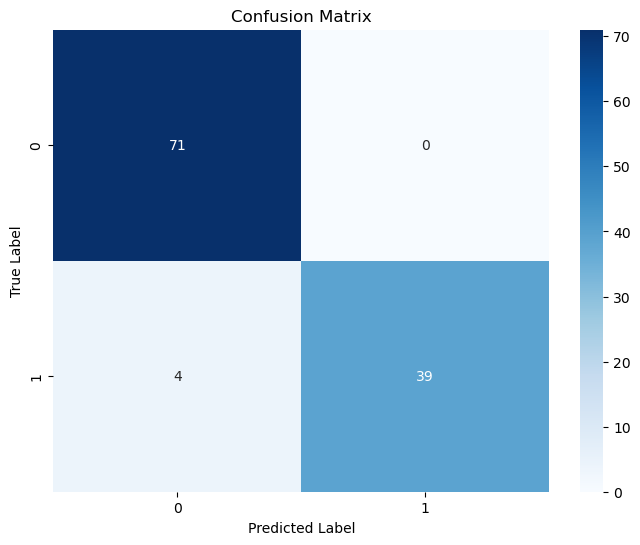

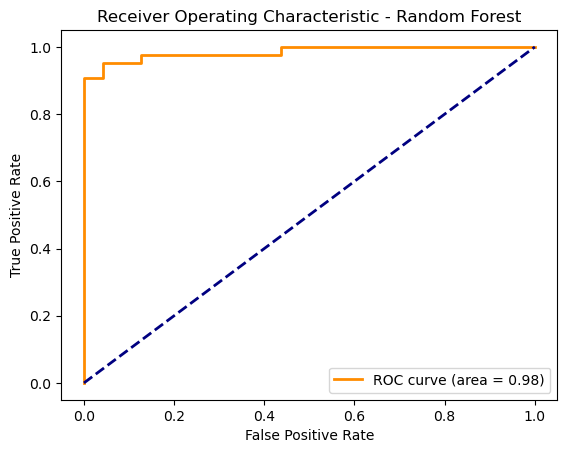

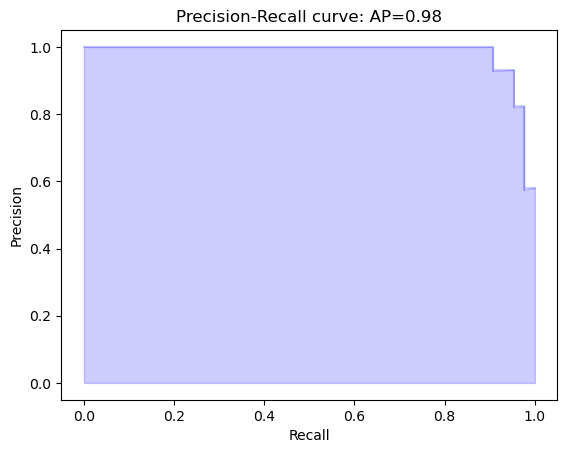

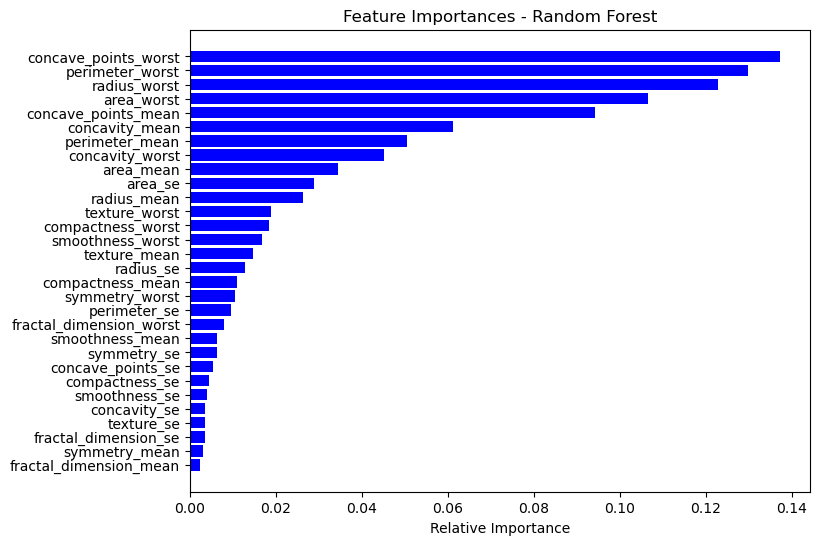

False Positives - Descriptive Statistics:
        radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
count     4.000000      4.000000        4.000000   4.000000         4.000000   
mean     -0.232691     -0.677466       -0.197899  -0.296640         0.566183   
std       0.697493      0.432663        0.656145   0.568075         1.019453   
min      -0.924184     -1.271501       -0.858650  -0.833453        -0.498795   
25%      -0.782544     -0.832225       -0.711805  -0.751222        -0.205913   
50%      -0.229786     -0.589373       -0.174425  -0.333310         0.619191   
75%       0.320067     -0.434614        0.339480   0.121273         1.391287   
max       0.452991     -0.259618        0.415903   0.313511         1.525146   

       compactness_mean  concavity_mean  concave_points_mean  symmetry_mean  \
count          4.000000        4.000000             4.000000       4.000000   
mean           0.561988        0.095175             0.278861       0.040335   

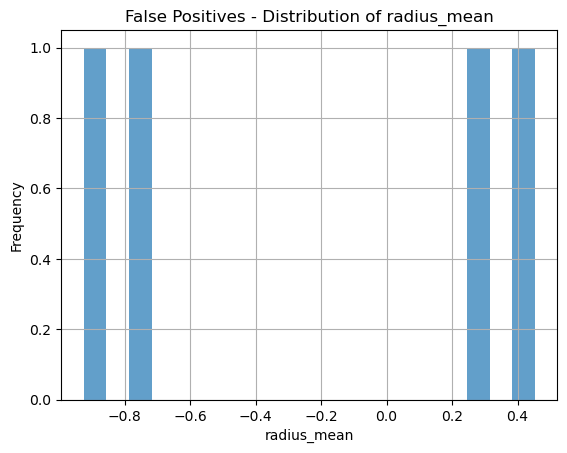

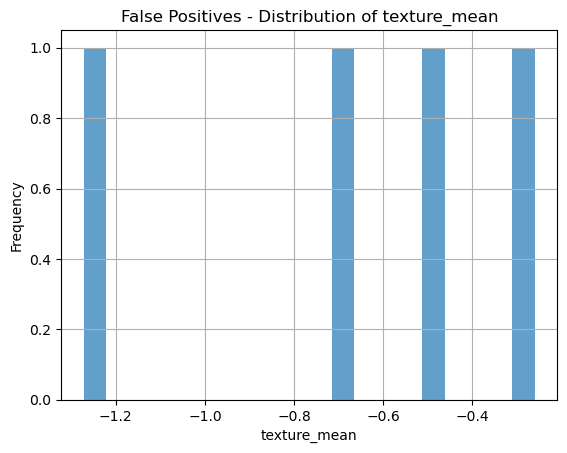

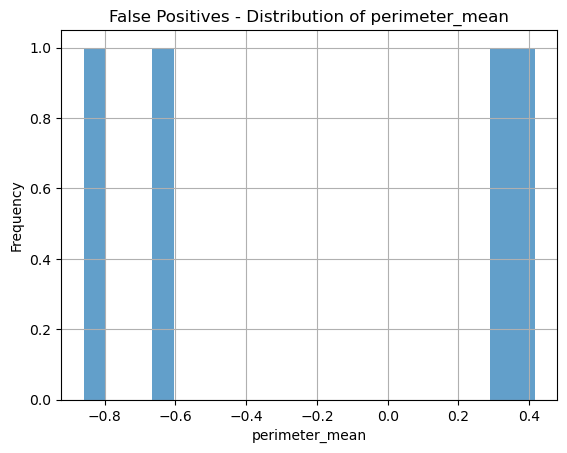

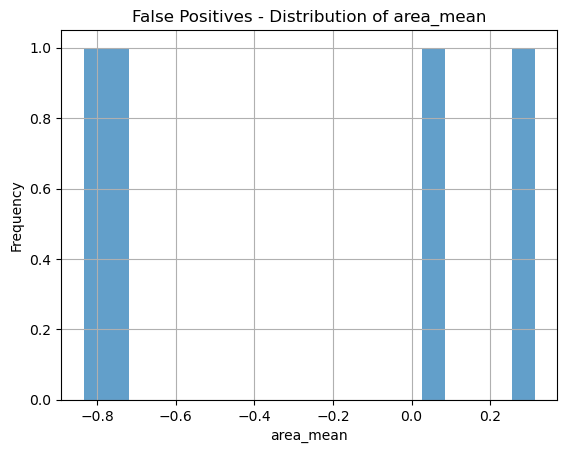

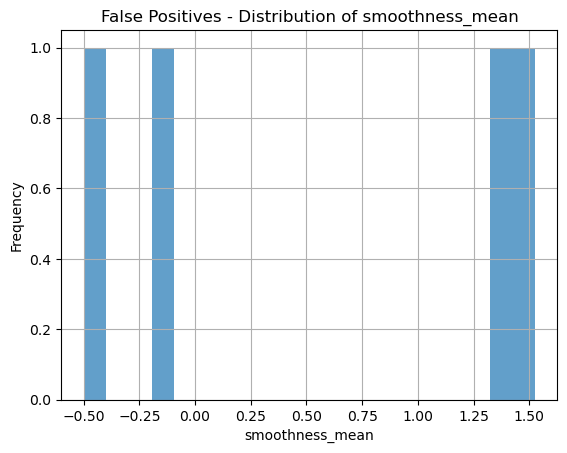

...

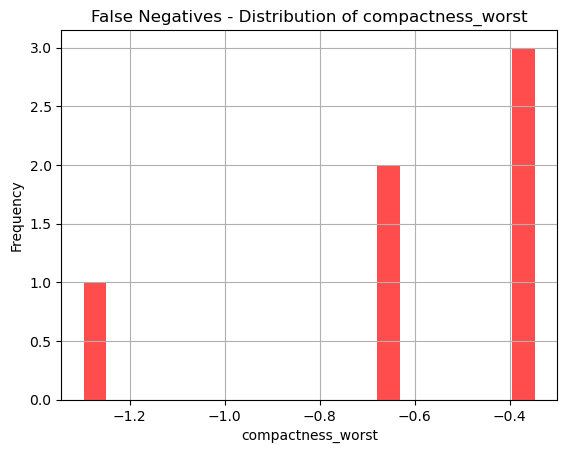

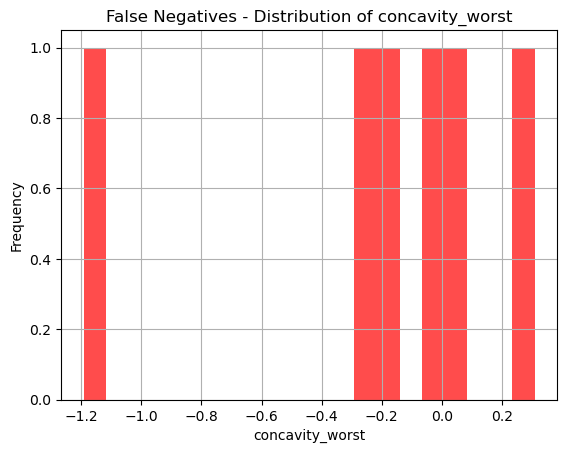

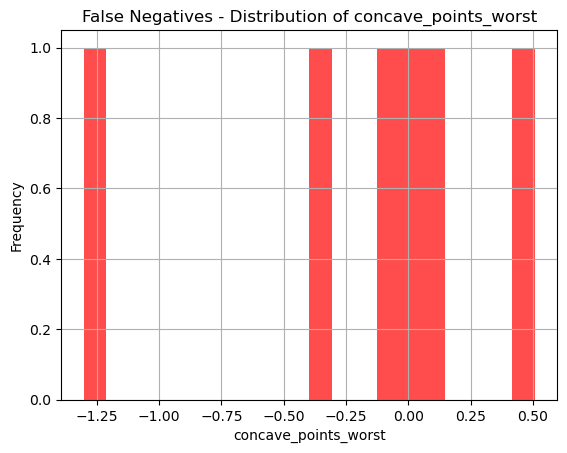

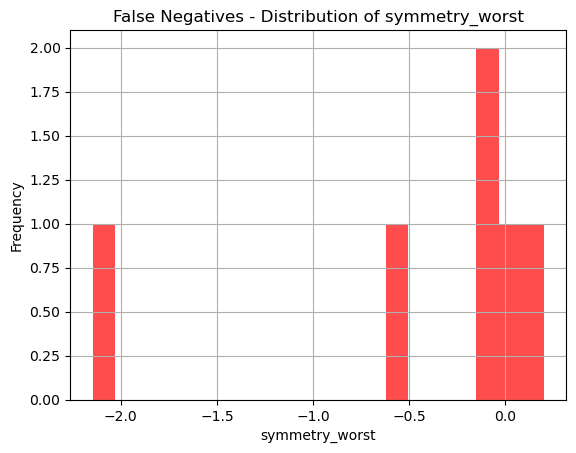

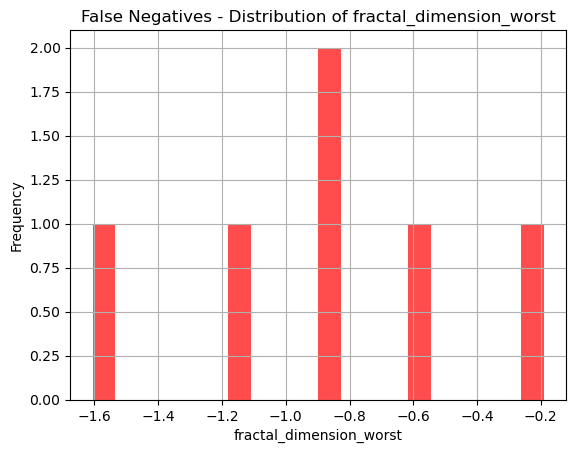

In [9]:
#Fitting Random Forest Classification Algorithm
from sklearn.ensemble import RandomForestClassifier
# classifier_RF = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
# classifier_RF.fit(X_train, Y_train)
#98.6 Acuracy

# Define the parameter distributions
param_distributions = {
    'n_estimators': randint(100, 1000),
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20)
}

# Create a Random Forest model
RF = RandomForestClassifier(criterion='entropy', random_state=0)

# Instantiate RandomizedSearchCV
random_search_RF = RandomizedSearchCV(RF, param_distributions, n_iter=100, cv=10, verbose=0, random_state=0, n_jobs=-1)

# Fit RandomizedSearchCV to the data
random_search_RF.fit(X_train, Y_train)

# Best parameters found
print("Best Parameters:", random_search_RF.best_params_)

# Use the best parameters to create a new Random Forest model
best_RF = random_search_RF.best_estimator_

# Predicting the Test set results
# Y_pred_RF = classifier_RF.predict(X_test)

Y_pred_RF = best_RF.predict(X_test)

# Creating the confusion Matrix
cm_RF = confusion_matrix(Y_test, Y_pred_RF)
accuracy_RF = accuracy_score(Y_test, Y_pred_RF)
recall_RF = recall_score(Y_test, Y_pred_RF)
f1_RF = f1_score(Y_test, Y_pred_RF)

# Storing results
model_results['Decision Tree'] = {
    'Confusion Matrix': cm_RF, 
    'Accuracy': accuracy_RF, 
    'Recall': recall_RF, 
    'F1 Score': f1_RF
}


print("Random Forest Accuracy:", accuracy_RF)
print("Random Forest Recall:", recall_RF)
print("Random Forest F1 Score:", f1_RF)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_RF, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
# plt.savefig("ConfusionMatrixRF.png")
plt.show()


# Compute ROC curve for the best model
fpr_RF, tpr_RF, thresholds_RF = roc_curve(Y_test, best_RF.predict_proba(X_test)[:, 1])
roc_auc_RF = auc(fpr_RF, tpr_RF)

# Plot ROC Curve
plt.figure()
plt.plot(fpr_RF, tpr_RF, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_RF)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest')
plt.legend(loc="lower right")
# plt.savefig("RocRF.png")
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score

precision_RF, recall_RF, _ = precision_recall_curve(Y_test, best_RF.predict_proba(X_test)[:, 1])
average_precision_RF = average_precision_score(Y_test, best_RF.predict_proba(X_test)[:, 1])

plt.figure()
plt.step(recall_RF, precision_RF, where='post', color='b', alpha=0.2)
plt.fill_between(recall_RF, precision_RF, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve: AP={0:0.2f}'.format(average_precision_RF))
# plt.savefig("PrecisionrecallRF.png")
plt.show()


# features = ['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3']
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']
importances = best_RF.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 6))
plt.title("Feature Importances - Random Forest")
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
# plt.savefig("featureimpRF.png")
plt.show()

# Convert X_test to a DataFrame if it's not already
if isinstance(X_test, np.ndarray):
    X_test_df = pd.DataFrame(X_test, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst'])
else:
    X_test_df = X_test

# Identify misclassified instances
misclassified_fp = X_test_df[(Y_pred_DT == 1) & (Y_test == 0)]  # False Positives
misclassified_fn = X_test_df[(Y_pred_DT == 0) & (Y_test == 1)]  # False Negatives


print("False Positives - Descriptive Statistics:\n", misclassified_fp.describe())
print("False Negatives - Descriptive Statistics:\n", misclassified_fn.describe())


# Histograms for false positives
for column in misclassified_fp.columns:
    plt.figure()
    misclassified_fp[column].hist(bins=20, alpha=0.7)
    plt.title(f"False Positives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

# Histograms for false negatives
for column in misclassified_fn.columns:
    plt.figure()
    misclassified_fn[column].hist(bins=20, alpha=0.7, color='red')
    plt.title(f"False Negatives - Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()




                       Confusion Matrix  Accuracy    Recall  F1 Score
Logistic Regression  [[70, 1], [2, 41]]  0.973684  0.953488  0.964706
K-NN                 [[71, 0], [4, 39]]  0.964912  0.906977   0.95122
SVM                  [[69, 2], [4, 39]]  0.947368  0.906977  0.928571
RBF                  [[70, 1], [4, 39]]   0.95614  0.906977  0.939759
Naive Bayes          [[68, 3], [5, 38]]  0.929825  0.883721  0.904762
Decision Tree        [[71, 0], [4, 39]]  0.964912  0.906977   0.95122


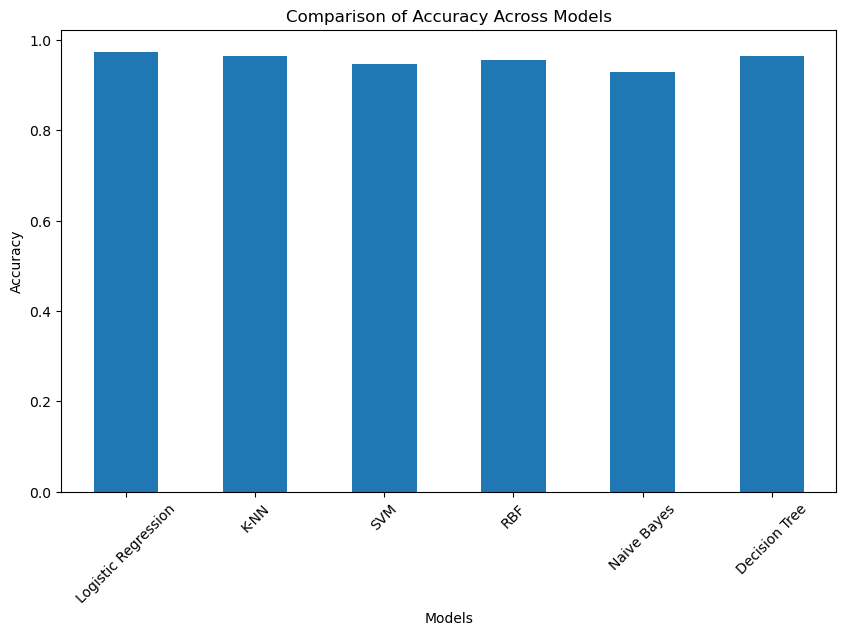

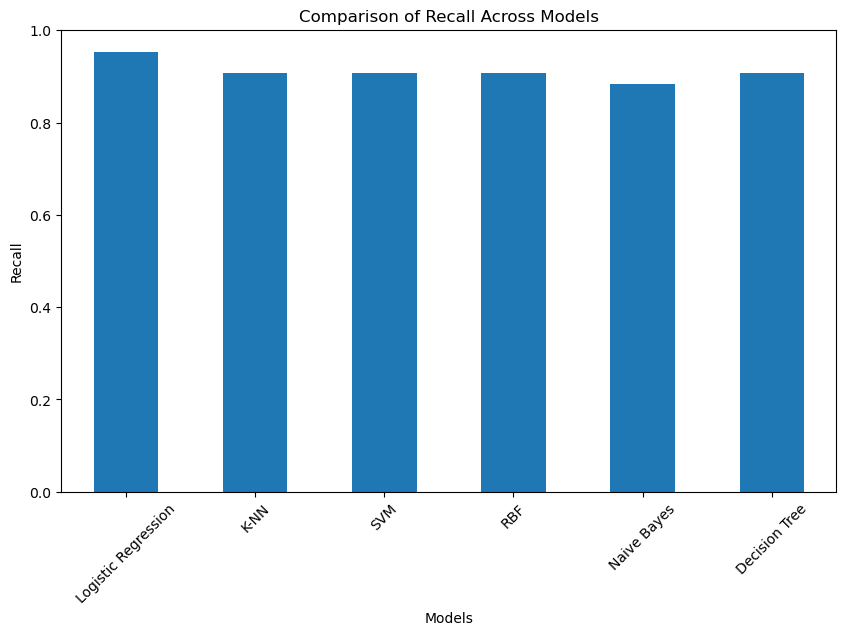

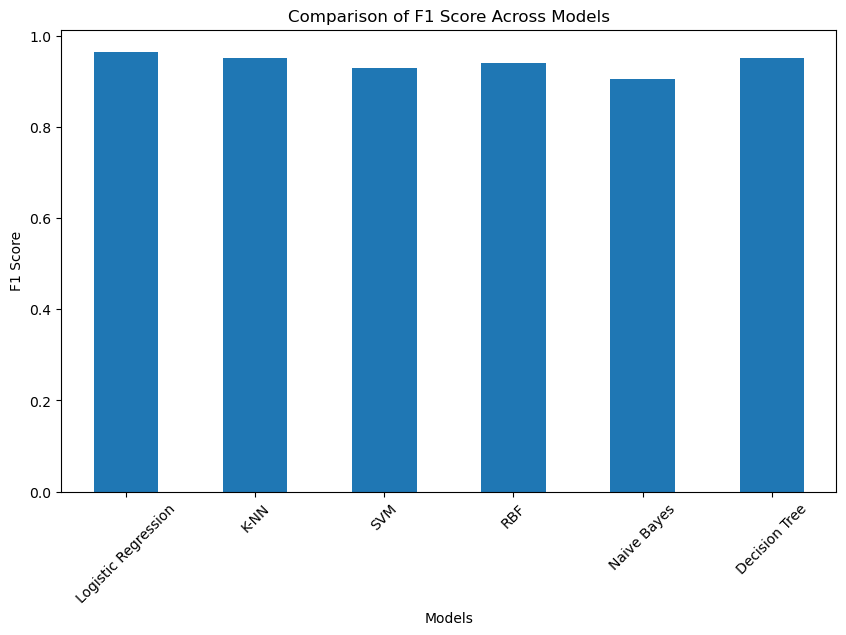

In [10]:
# Convert the model results into a DataFrame
df_results = pd.DataFrame(model_results).T

# Print the DataFrame for a tabular comparison
print(df_results)

# Plotting the results for comparison
# Bar plot for each metric
metrics = ['Accuracy', 'Recall', 'F1 Score']
for metric in metrics:
    plt.figure(figsize=(10, 6))
    df_results[metric].plot(kind='bar')
    plt.title(f'Comparison of {metric} Across Models')
    plt.ylabel(metric)
    plt.xlabel('Models')
    plt.xticks(rotation=45)
#     plt.savefig(f"Comparison_{metric}.png")
    plt.show()

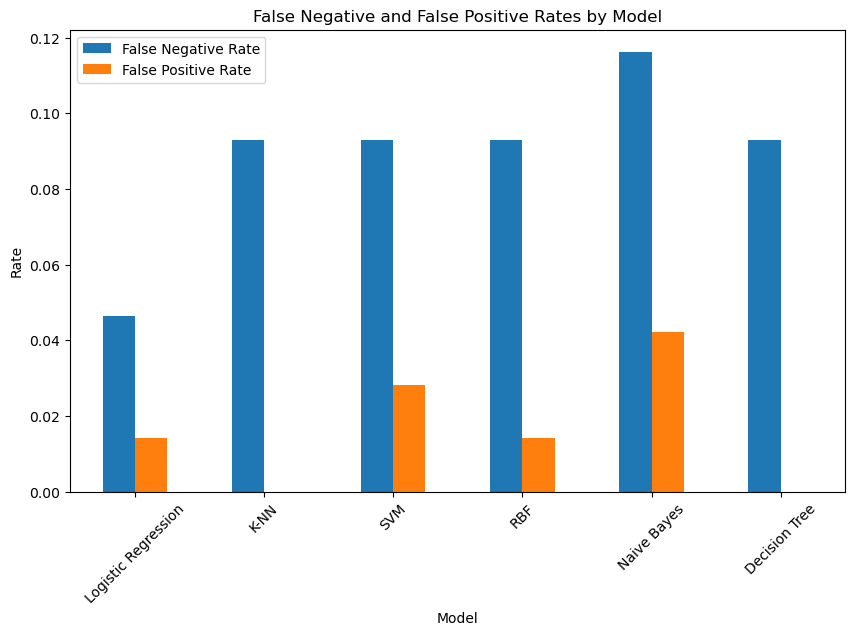

In [11]:

    
fn_rates = {}
fp_rates = {}

for model_name, results in model_results.items():
    cm = results['Confusion Matrix']
    FN_rate = cm[1, 0] / (cm[1, 0] + cm[1, 1])  # False Negative Rate = FN / (FN + TP)
    FP_rate = cm[0, 1] / (cm[0, 1] + cm[0, 0])  # False Positive Rate = FP / (FP + TN)
    fn_rates[model_name] = FN_rate
    fp_rates[model_name] = FP_rate

# Convert the rates to DataFrame for easy plotting
rates_df = pd.DataFrame({'False Negative Rate': fn_rates, 'False Positive Rate': fp_rates})

# Plotting
rates_df.plot(kind='bar', figsize=(10, 6))
plt.title('False Negative and False Positive Rates by Model')
plt.ylabel('Rate')
plt.xlabel('Model')
plt.xticks(rotation=45)
plt.savefig("FP_FRofmodels.png")
plt.show()    
    


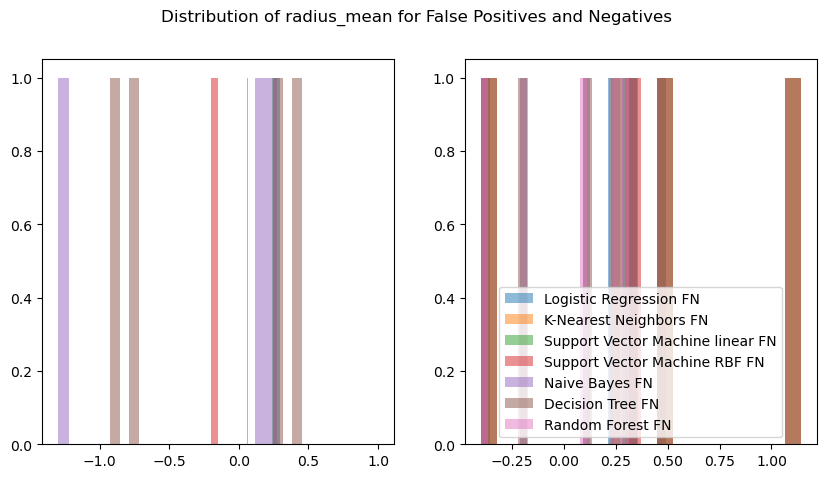

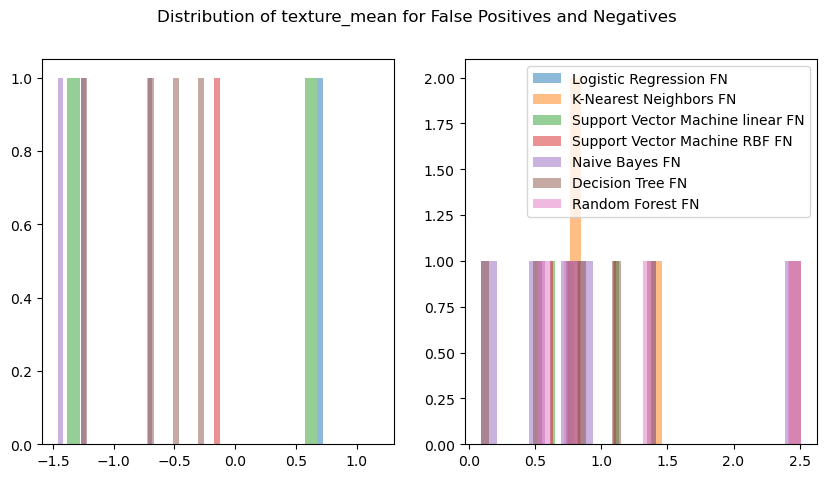

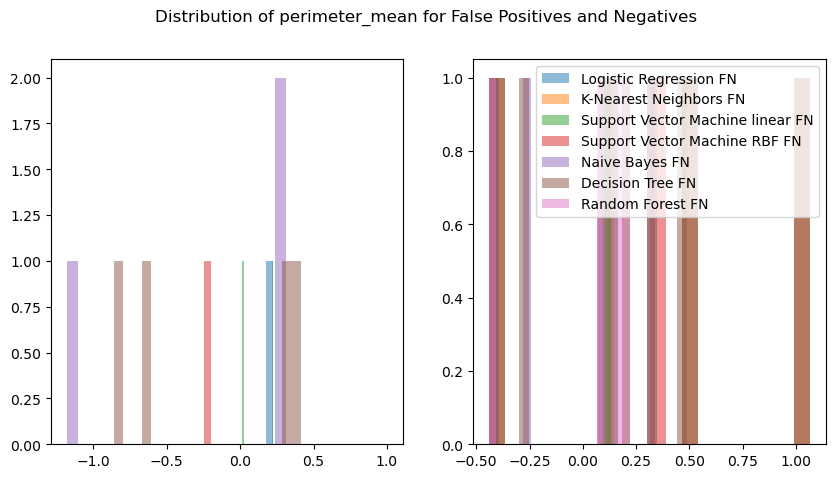

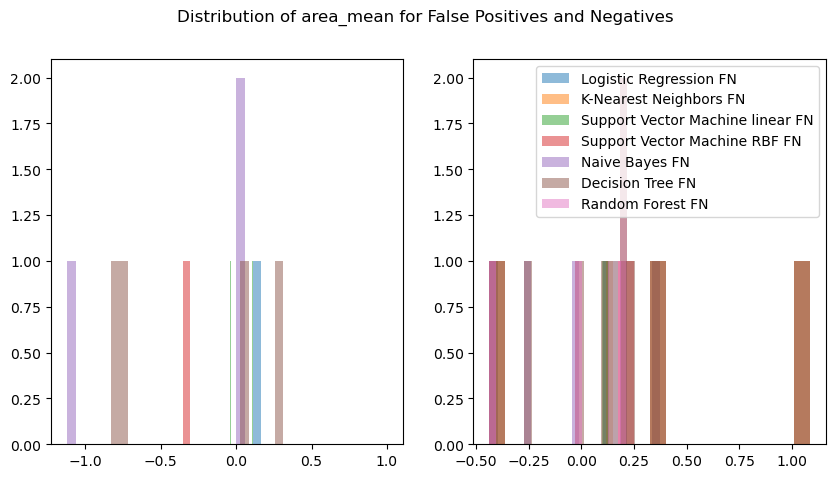

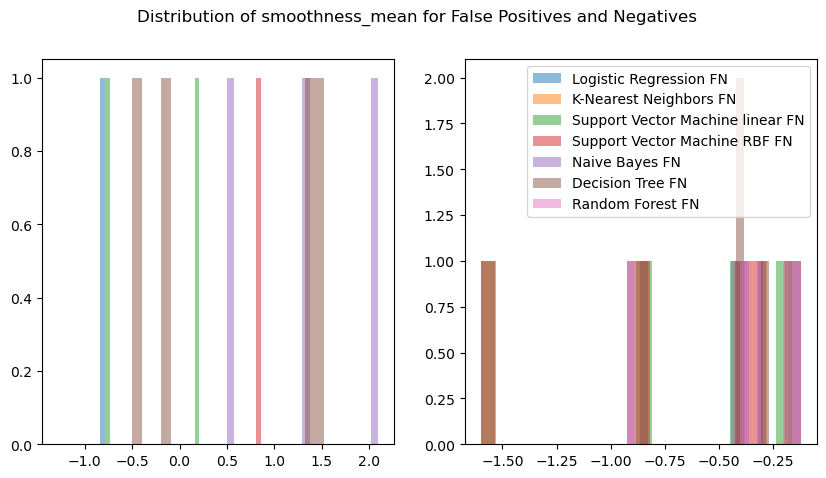

...

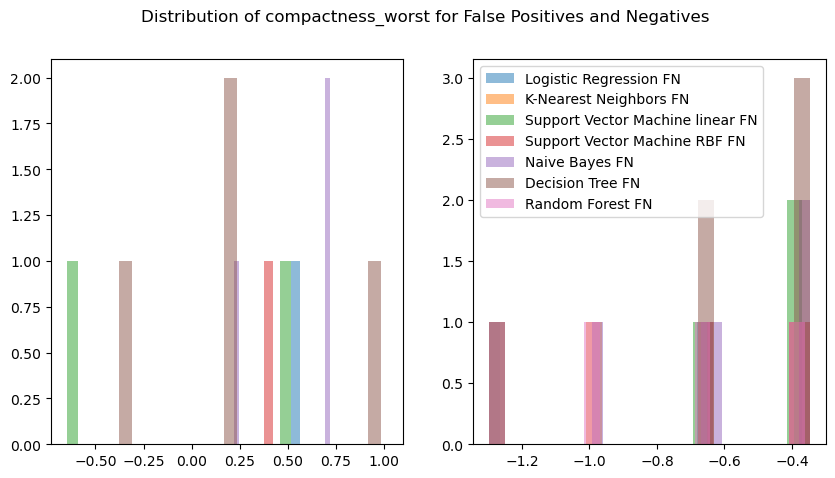

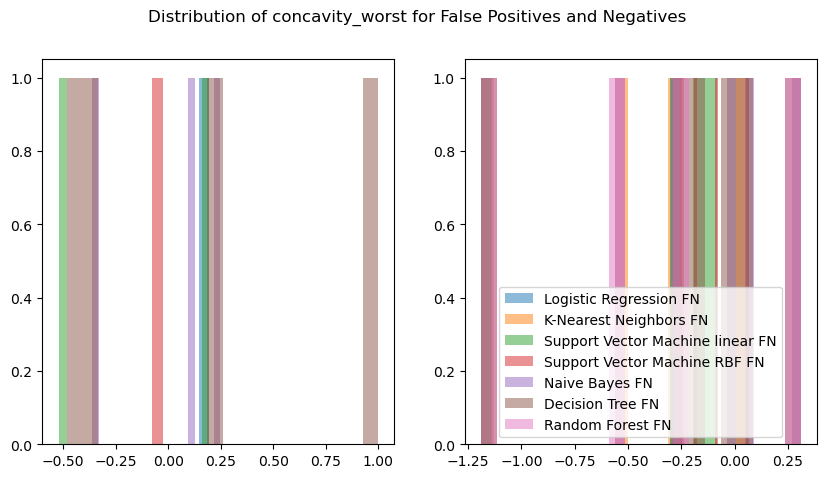

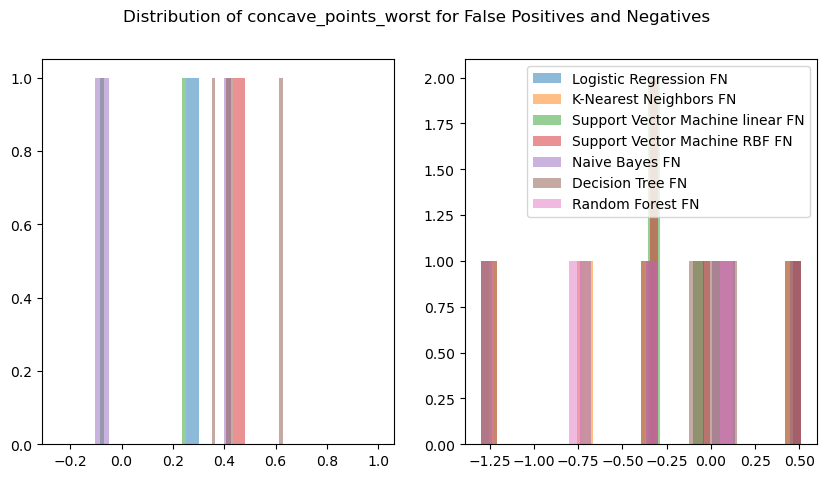

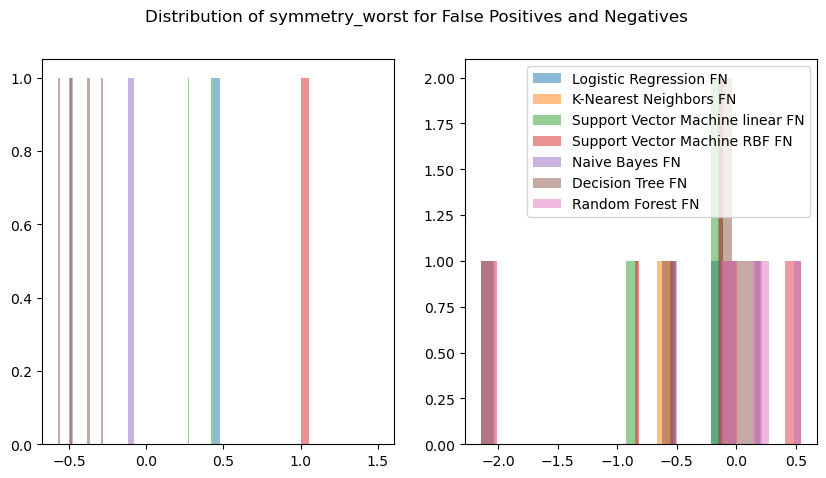

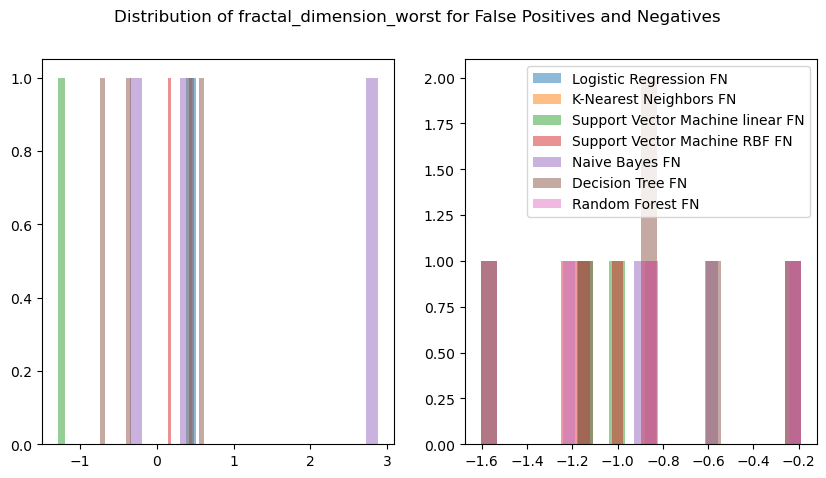

In [12]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np


models = [best_logreg, best_knn, best_svm, best_rbf, classifier_NB, best_DT, best_RF]  
model_names = ['Logistic Regression', 'K-Nearest Neighbors', 'Support Vector Machine linear','Support Vector Machine RBF','Naive Bayes','Decision Tree','Random Forest' ]  # replace with your model names
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']


# Dictionary to hold FP and FN data
model_errors = {}

# Calculate FPs and FNs for each model
for model, name in zip(models, model_names):
    # Make predictions
    Y_pred = model.predict(X_test)
    
    # Confusion matrix
    cm = confusion_matrix(Y_test, Y_pred)
    TN, FP, FN, TP = cm.ravel()
    
    # Extract indices of false positives and negatives
    fp_indices = np.where((Y_pred == 1) & (Y_test == 0))[0]
    fn_indices = np.where((Y_pred == 0) & (Y_test == 1))[0]
    
    # Extract the samples
    fp_samples = X_test[fp_indices]
    fn_samples = X_test[fn_indices]
    
    # Store in dictionary
    model_errors[name] = {'FP': fp_samples, 'FN': fn_samples}

# Plotting the errors for each feature across all models
for feature_idx, feature in enumerate(features):
    plt.figure(figsize=(10, 5))
    
    # Plot for each model
    for name in model_names:
        fp_samples = model_errors[name]['FP']
        fn_samples = model_errors[name]['FN']
        
        # Subplot for false positives
        plt.subplot(1, 2, 1)
        plt.hist(fp_samples[:, feature_idx], bins=20, alpha=0.5, label=f'{name} FP')
        
        # Subplot for false negatives
        plt.subplot(1, 2, 2)
        plt.hist(fn_samples[:, feature_idx], bins=20, alpha=0.5, label=f'{name} FN')
        
    plt.suptitle(f'Distribution of {feature} for False Positives and Negatives')
    plt.legend()
    plt.savefig(f"FP_FN_{feature}.png")
    plt.show()


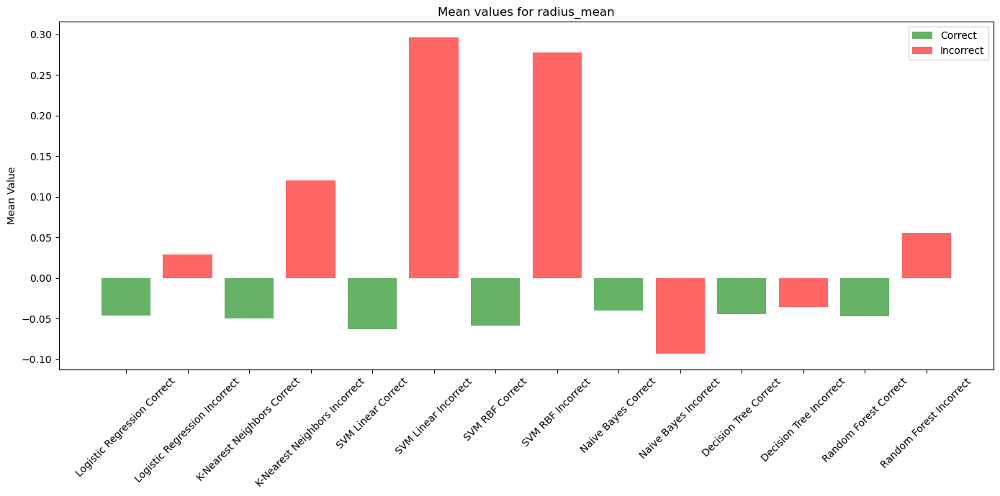

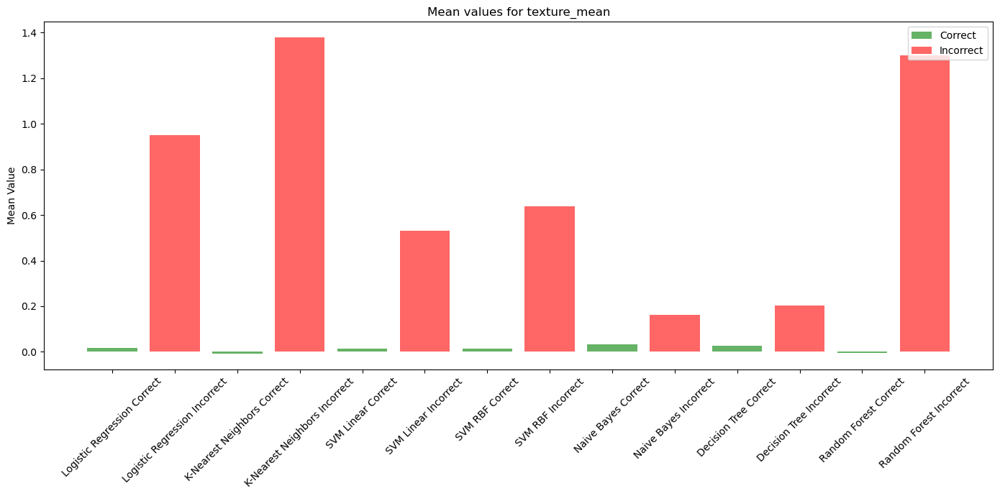

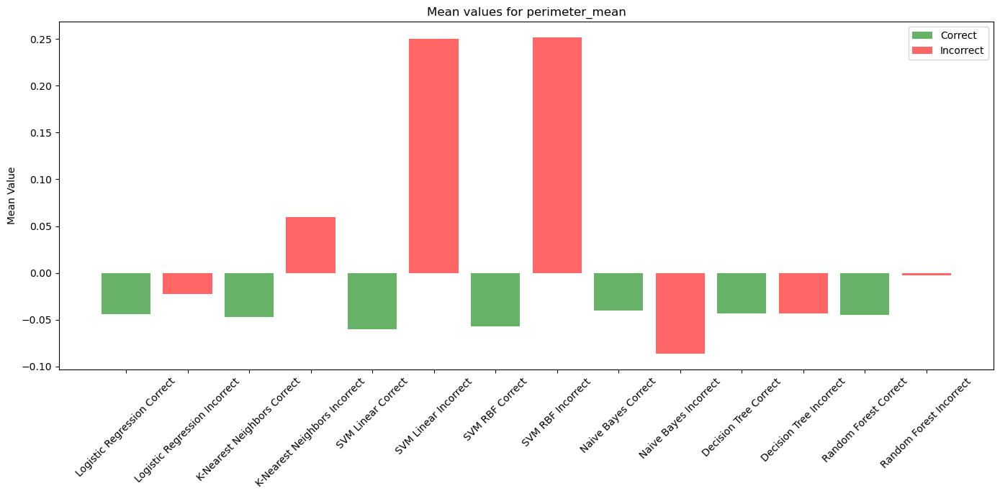

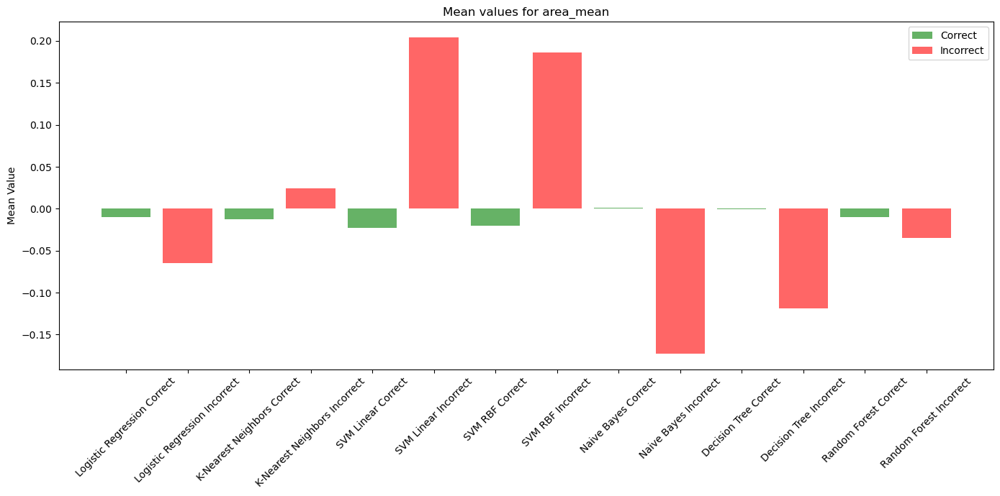

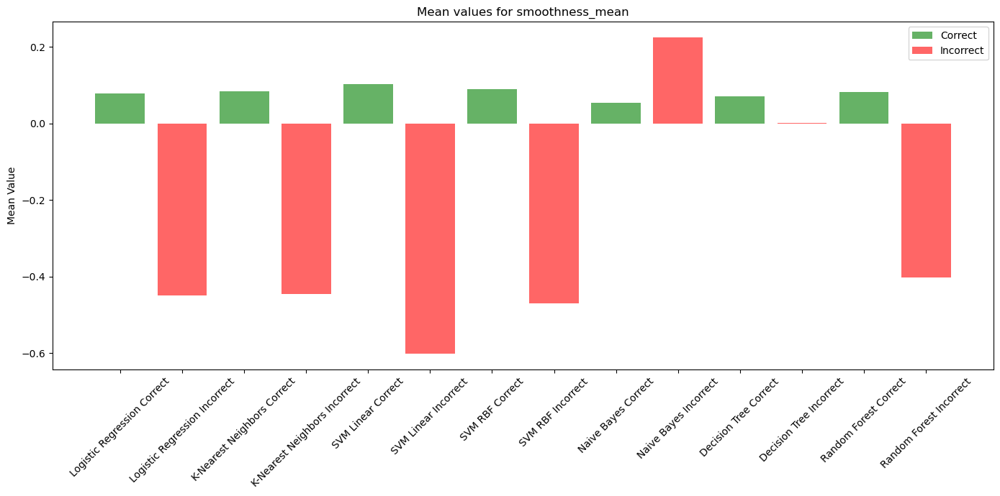

...

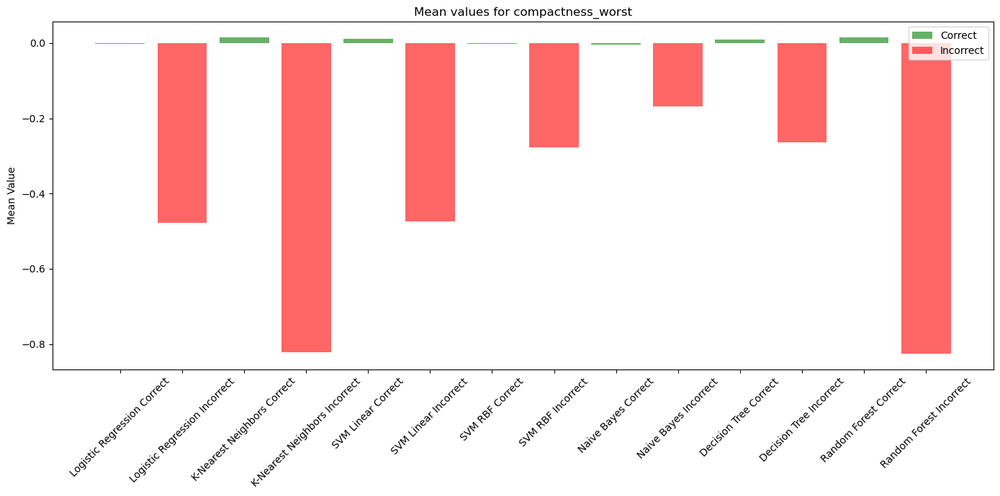

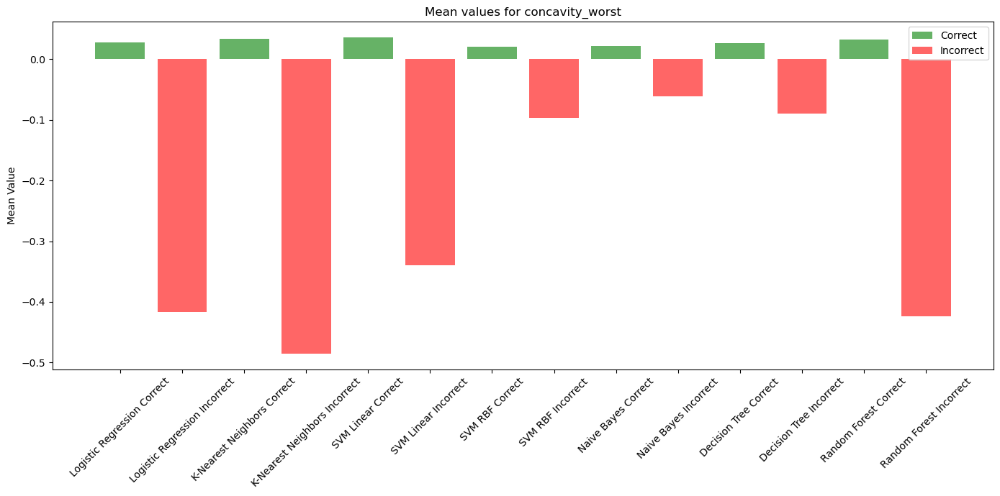

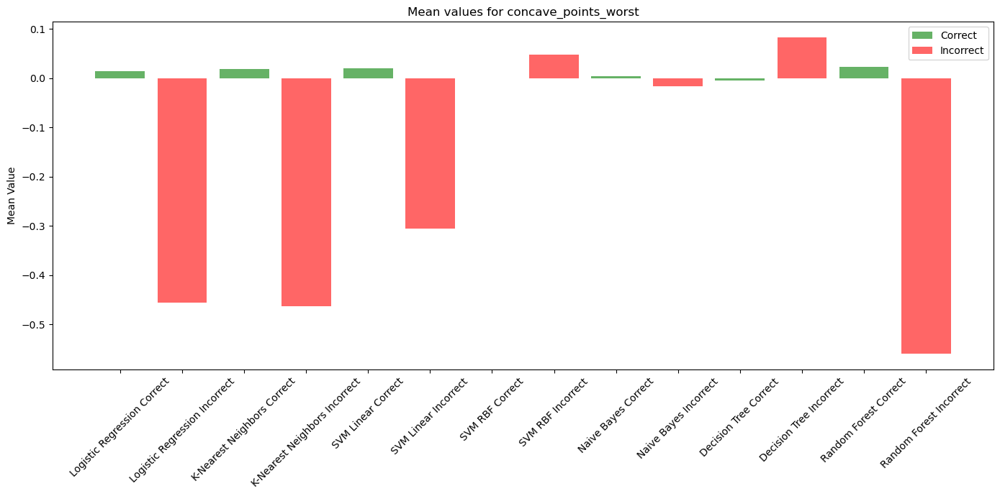

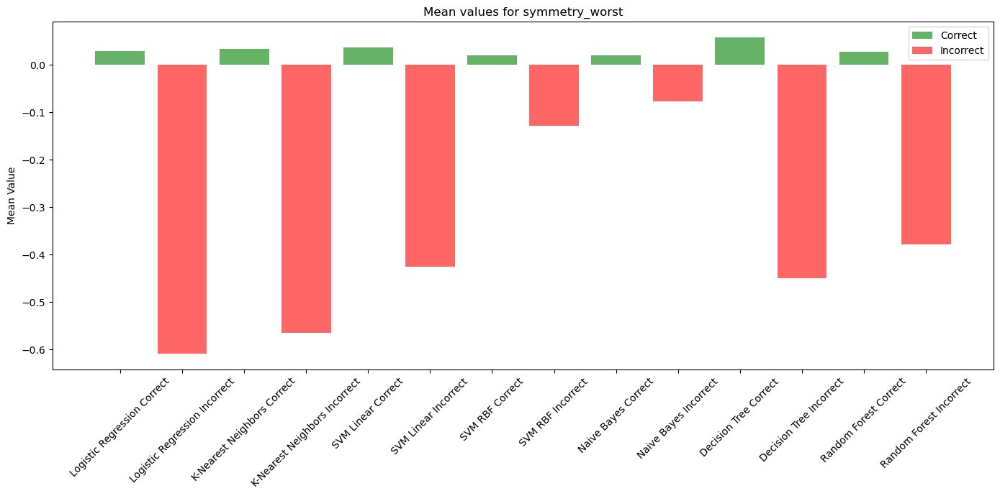

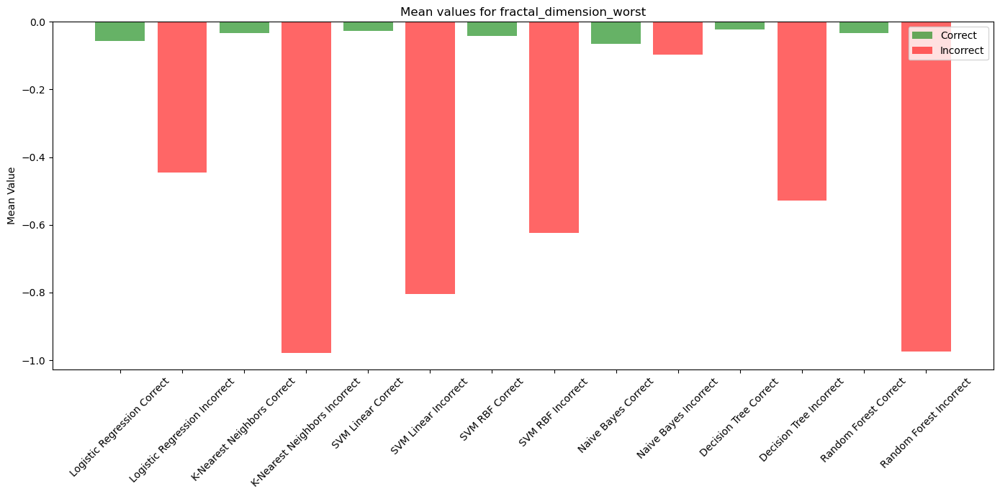

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10; t

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_spli

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=10; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END max_depth=None, min_samples_leaf=4, min_samples_split=

In [13]:
import matplotlib.pyplot as plt
import numpy as np


models = [best_logreg, best_knn, best_svm, best_rbf, classifier_NB, best_DT, best_RF]
model_names = ['Logistic Regression', 'K-Nearest Neighbors', 'SVM Linear', 'SVM RBF', 'Naive Bayes', 'Decision Tree', 'Random Forest']
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']



def plot_feature_distributions(models, model_names, features, X_test, Y_test):
    for feature_idx, feature in enumerate(features):
        plt.figure(figsize=(14, 7))
        
        # Store the means for correct and incorrect classifications
        correct_means = []
        incorrect_means = []
        
        for model, name in zip(models, model_names):
            Y_pred = model.predict(X_test)
            
            # Boolean arrays for correct and incorrect predictions
            correct = Y_pred == Y_test
            incorrect = Y_pred != Y_test
            
            # Calculate means
            correct_mean = X_test[correct, feature_idx].mean()
            incorrect_mean = X_test[incorrect, feature_idx].mean()
            
            correct_means.append(correct_mean)
            incorrect_means.append(incorrect_mean)
            
            # Plotting
            plt.bar(name + ' Correct', correct_mean, color='green', alpha=0.6)
            plt.bar(name + ' Incorrect', incorrect_mean, color='red', alpha=0.6)
        
        plt.title(f'Mean values for {feature}')
        plt.ylabel('Mean Value')
        plt.xticks(rotation=45)
        
        # Add legend outside the loop
        plt.legend(['Correct', 'Incorrect'], loc='upper right')
        plt.tight_layout()
        plt.savefig(f'feature_means_{feature}.png')
        plt.show()

plot_feature_distributions(models, model_names, features, X_test, Y_test)
